# Загрузки и библиотеки

In [ ]:
%%capture
!pip install --upgrade ultralytics
!pip install mplcursors

In [ ]:
import os
import shutil
from ultralytics import YOLO
import cv2
import numpy as np
from matplotlib import pyplot as plt
from IPython.display import display
from PIL import Image
import matplotlib.patches as patches
import random
import pandas as pd
import re
import gdown
import yaml
import zipfile
import json

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


# Загрузка датасета счетчиков и вывод на экран случайного изображения

In [ ]:
# Ссылка на таргет
url_cvat = '****'
file_id_cvat = '***'
download_url_cvat = f'https://drive.google.com/uc?id={file_id_cvat}'

# Папка скачивания
output = '/content/'  # Укажите нужное имя файла, например 'your_file.zip'

# Скачивание файла
gdown.download(download_url_cvat, output, quiet=False)

# Путь, куда вы хотите извлечь файлы
extract_to = '/content/CVAT_Folders'

!unzip -q -o COCO_to_YOLOv8.zip  -d {extract_to}

In [ ]:
# Базовый путь, в котором находятся папки YOLO_dataset_1, YOLO_dataset_2, и т. д.
base_path = '/content'
folder_path = '/content/CVAT_Folders'

# Путь к файлу конфигурации data.yaml
data_yaml_path = os.path.join('/content/CVAT_Folders', 'data.yaml')

# Пути для папок train и val
train_images_path = os.path.join(base_path, 'train', 'images')
val_images_path = os.path.join(base_path, 'val', 'images')
train_labels_path = os.path.join(base_path, 'train', 'labels')
val_labels_path = os.path.join(base_path, 'val', 'labels')

# Создаем папки для train и val
os.makedirs(train_images_path, exist_ok=True)
os.makedirs(val_images_path, exist_ok=True)
os.makedirs(train_labels_path, exist_ok=True)
os.makedirs(val_labels_path, exist_ok=True)

# Список всех папок, которые нужно объединить
folders = [f for f in os.listdir(folder_path) if os.path.isdir(os.path.join(folder_path, f)) and f.startswith('YOLO_dataset')]

# Объединяем все файлы labels и images из всех папок
all_label_files = []

for folder in folders:
    labels_path = os.path.join(folder_path, folder, 'labels')
    images_path = os.path.join(folder_path, folder, 'images')

    if os.path.exists(labels_path) and os.path.exists(images_path):
        label_files = [f for f in os.listdir(labels_path) if f.endswith('.txt')]

        for label_file in label_files:
            image_file = label_file.replace('.txt', '.jpg')
            image_path = os.path.join(images_path, image_file)

            # Проверяем, что файл изображения существует
            if os.path.exists(image_path):
                all_label_files.append((os.path.join(labels_path, label_file), image_path))

# Перемешиваем файлы для случайного разделения
random.shuffle(all_label_files)

# Считаем количество файлов для train и val
train_size = int(0.8 * len(all_label_files))
val_size = len(all_label_files) - train_size

# Разделяем файлы на train и val
train_files = all_label_files[:train_size]
val_files = all_label_files[train_size:]

# Функция для копирования файлов
def move_files(file_list, dst_labels_path, dst_images_path):
    for label_path, image_path in file_list:
        dst_label_file = os.path.join(dst_labels_path, os.path.basename(label_path))
        dst_image_file = os.path.join(dst_images_path, os.path.basename(image_path))

        # Копируем файлы
        shutil.move(label_path, dst_label_file)
        shutil.move(image_path, dst_image_file)

# Перемещаем файлы в train и val папки
move_files(train_files, train_labels_path, train_images_path)
move_files(val_files, val_labels_path, val_images_path)

# Вывод информации о количестве файлов в train и val папках
train_image_count = len(os.listdir(train_images_path))
val_image_count = len(os.listdir(val_images_path))

print(f"Количество изображений в train: {train_image_count}")
print(f"Количество изображений в val: {val_image_count}")

print("Датасет успешно собран и разделен на train и val.")

Количество изображений в train: 812
Количество изображений в val: 203
Датасет успешно собран и разделен на train и val.


## Вывод случайного изображения из базы

Labels: 0 - year, 1 - type, 2 - mode, 3 - number, 4 - logo, 5 - amper, 6 - volt, 7 - 1phase, 8 - 3phase



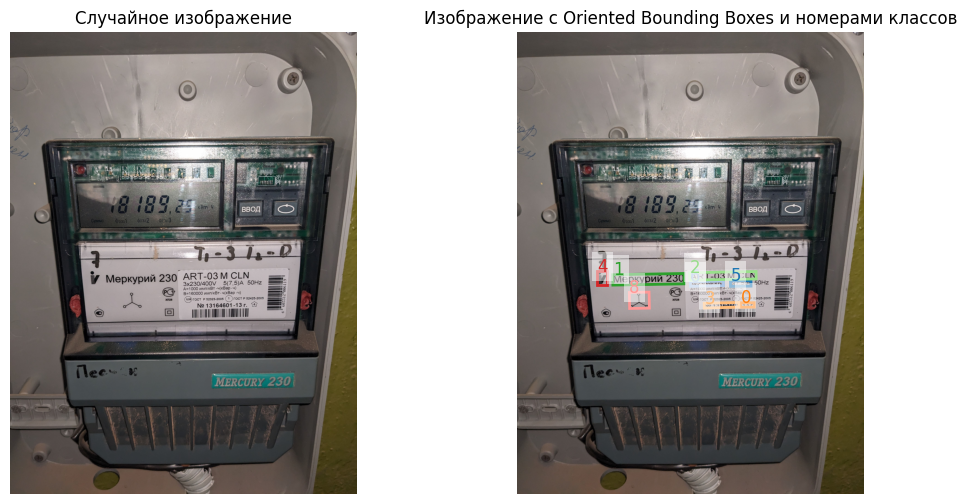

In [ ]:
# Функция для загрузки меток из YAML файла
def load_labels_from_yaml(yaml_path):
    with open(yaml_path, 'r') as file:
        data = yaml.safe_load(file)
    return data['names']

# Загрузка меток
labels = load_labels_from_yaml(data_yaml_path)

# Печать меток
labels_str = ", ".join([f"{i} - {name}" for i, name in enumerate(labels)])
print("Labels:", labels_str)
print()

# Выбор случайного изображения
random_image_filename = random.choice(os.listdir(os.path.join(base_path, 'train/images')))
image_path = os.path.join(base_path, 'train/images', random_image_filename)

# Получение соответствующего файла с координатами
label_filename = os.path.splitext(random_image_filename)[0] + '.txt'
label_path = os.path.join(base_path, 'train/labels', label_filename)

# Отображение случайного изображения
image = Image.open(image_path)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Случайное изображение")
plt.axis('off')

# Функция для отрисовки OBB
def draw_obb(ax, points, color):
    polygon = patches.Polygon(points, closed=True, linewidth=2, edgecolor=color, facecolor='none')
    ax.add_patch(polygon)

# Отображение изображения с bounding box, если файл с координатами существует
if os.path.exists(label_path):
    with open(label_path, 'r') as label_file:
        lines = label_file.readlines()

    plt.subplot(1, 2, 2)
    plt.imshow(image)

    colors = plt.colormaps['tab20']

    for i, line in enumerate(lines):
        values = line.strip().split()
        label_index = int(values[0])
        if len(values[1:]) == 8:
            points = [(float(values[j]) * image.width, float(values[j + 1]) * image.height) for j in range(1, 9, 2)]
            draw_obb(plt.gca(), points, colors(i % 20))

            plt.text(points[0][0], points[0][1], str(label_index), color=colors(i % 20), fontsize=12,
                     bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

    plt.title("Изображение с Oriented Bounding Boxes и номерами классов")
    plt.axis('off')
else:
    print('Объектов на изображении нет')

plt.show()

# Обучение модели Yolo8m-obb

In [ ]:
# Загружаем предобученную модель YOLO, которая поддерживает OBB
model = YOLO("yolov8m-obb.pt")  # Ваш кастомный предобученный файл модели

# Обучаем модель
results = model.train(
    data=data_yaml_path,  # путь к файлу конфигурации
    epochs=300,           # количество эпох
    imgsz=640,            # размер изображения
    batch=32,             # размер батча
    name='yolo8n_custom_obb'  # Имя каталога результатов
)

Ultralytics YOLOv8.2.79 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
engine/trainer: task=obb, mode=train, model=yolov8m-obb.pt, data=/content/data.yaml, epochs=300, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolo8n_custom_obb4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=Tru

train: Scanning /content/train/labels.cache... 812 images, 2 backgrounds, 0 corrupt: 100%|██████████| 812/812 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/train/images/1028-576.jpg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/train/images/1113-583.jpg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/train/images/1113-584.jpg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/train/images/1117-592.jpg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/train/images/1117-594.jpg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/train/images/1171-625.jpg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/train/images/1239-644.jpg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/train/images/1239-645.jpg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/train/images/1256-653.jpg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/train/images/1342-689.jpg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/train/images/1342-691.jpg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/train/images/1362-700.jpg: 


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/val/labels.cache... 203 images, 3 backgrounds, 0 corrupt: 100%|██████████| 203/203 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/val/images/1117-593.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/val/images/1121-601.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/val/images/1121-602.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/val/images/1171-626.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/val/images/1342-690.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/val/images/1442-738.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/val/images/1469-778.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/val/images/20230217_142436.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/val/images/20230412_181745.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/val/images/20230525_125452.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/val/images/20230529_165953.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/val/images/20230607_164652.jpg: corrupt JPEG 

Plotting labels to runs/obb/yolo8n_custom_obb4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 83 weight(decay=0.0), 93 weight(decay=0.0005), 92 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/obb/yolo8n_custom_obb4
Starting training for 300 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/300      19.6G      2.462      4.231      2.312        217        640: 100%|██████████| 26/26 [00:19<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:13<00:00,  1.91s/it]

                   all        203       1529      0.524      0.335       0.31      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/300      19.6G      1.272      1.985      1.945        108        640: 100%|██████████| 26/26 [00:17<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.46it/s]


                   all        203       1529      0.733      0.539      0.635      0.456

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/300      19.4G      1.097       1.41      1.895        151        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]


                   all        203       1529      0.845      0.636      0.751      0.566

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/300      19.4G       1.01      1.148      1.852        154        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        203       1529      0.815      0.698      0.793      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/300      19.4G     0.9957      1.038      1.867        130        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.30it/s]

                   all        203       1529      0.869      0.731      0.841      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/300      19.6G     0.9615     0.9658      1.949        115        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.60it/s]

                   all        203       1529      0.875      0.752      0.862      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/300      19.6G     0.9311     0.8583      1.931        118        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.48it/s]

                   all        203       1529      0.898      0.801      0.886      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/300      19.4G     0.8847     0.7984      1.888        175        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.64it/s]

                   all        203       1529      0.893       0.81      0.894      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/300      19.6G     0.8624     0.7623      1.808        135        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.28it/s]

                   all        203       1529      0.888      0.814      0.894      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/300      19.6G      0.858      0.752      1.809        160        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.64it/s]

                   all        203       1529      0.863      0.837        0.9      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/300      19.5G     0.8256     0.7016      1.786        134        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.07it/s]

                   all        203       1529      0.922      0.849      0.923      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/300      19.6G     0.8164     0.6666      1.759        205        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]

                   all        203       1529      0.922      0.843      0.924      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/300      19.6G     0.8045     0.6673      1.771        117        640: 100%|██████████| 26/26 [00:17<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.39it/s]

                   all        203       1529      0.901      0.834      0.923      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/300      19.6G     0.8134     0.6416      1.809        163        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.59it/s]

                   all        203       1529      0.913      0.872      0.929      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/300      19.4G     0.7865     0.6212      1.801        122        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        203       1529      0.904      0.861      0.928      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/300      19.6G     0.7757     0.6248      1.768        123        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]

                   all        203       1529      0.932      0.847      0.935      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/300      19.6G     0.7711     0.6064      1.808        171        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]

                   all        203       1529      0.929      0.869      0.936      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/300      19.6G     0.7619     0.5963      1.754        118        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        203       1529      0.927      0.871      0.934      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/300      19.6G      0.755     0.5849      1.743        204        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]

                   all        203       1529      0.922      0.873       0.93      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/300      19.6G     0.7477     0.5746      1.701        117        640: 100%|██████████| 26/26 [00:16<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.86it/s]

                   all        203       1529      0.919      0.878      0.929       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/300      19.4G     0.7483     0.5794      1.716         99        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.55it/s]

                   all        203       1529      0.928      0.882      0.937      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/300      19.6G     0.7342     0.5609      1.724        146        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.58it/s]

                   all        203       1529      0.916      0.905      0.947      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/300      19.5G     0.7327     0.5444      1.729        137        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.91it/s]

                   all        203       1529      0.928      0.897      0.948       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/300      19.6G     0.7245     0.5412      1.714        156        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]

                   all        203       1529      0.938      0.884      0.945      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/300      19.4G     0.7199     0.5355      1.688        112        640: 100%|██████████| 26/26 [00:17<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.83it/s]

                   all        203       1529      0.938      0.898      0.948      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/300      19.6G     0.7247     0.5343      1.717        207        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]

                   all        203       1529       0.94      0.896      0.947      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/300      19.4G     0.7016     0.5169      1.659        125        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]

                   all        203       1529      0.943      0.889       0.95      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/300      19.6G     0.7048     0.5088      1.729        164        640: 100%|██████████| 26/26 [00:17<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.58it/s]

                   all        203       1529      0.925      0.906      0.948      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/300      19.6G     0.7154     0.5155      1.735        159        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        203       1529      0.938      0.894       0.95      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/300      19.4G     0.7045     0.5029      1.725        133        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        203       1529      0.941      0.909      0.953      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/300      19.6G     0.6872     0.4942      1.678        175        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.38it/s]

                   all        203       1529      0.932      0.908      0.951      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/300      19.6G     0.6807     0.4882       1.68        152        640: 100%|██████████| 26/26 [00:17<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.58it/s]

                   all        203       1529      0.942      0.902       0.95      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/300      19.6G     0.6836     0.4873      1.657        204        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.60it/s]

                   all        203       1529      0.917      0.905      0.942       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/300      19.6G     0.6877     0.4897      1.668         78        640: 100%|██████████| 26/26 [00:17<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.30it/s]


                   all        203       1529      0.943      0.907      0.949      0.774

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/300      19.6G     0.6686     0.4777      1.695        171        640: 100%|██████████| 26/26 [00:17<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.53it/s]

                   all        203       1529      0.951      0.902      0.947      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/300      19.4G     0.6711     0.4816      1.682        148        640: 100%|██████████| 26/26 [00:17<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.31it/s]

                   all        203       1529      0.922       0.93      0.953      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/300      19.6G     0.6665     0.4751      1.665         93        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]

                   all        203       1529      0.938      0.903      0.942      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/300      19.4G     0.6708     0.4847      1.689        148        640: 100%|██████████| 26/26 [00:17<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.20it/s]

                   all        203       1529      0.936      0.898      0.942       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/300      19.6G     0.6734     0.4779      1.697        156        640: 100%|██████████| 26/26 [00:17<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.40it/s]

                   all        203       1529      0.925      0.923      0.948      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/300      19.6G     0.6548     0.4509      1.653        193        640: 100%|██████████| 26/26 [00:17<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]

                   all        203       1529      0.936      0.917      0.953      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/300      19.6G     0.6588     0.4556      1.675        174        640: 100%|██████████| 26/26 [00:17<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.64it/s]

                   all        203       1529      0.937      0.922      0.949      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/300      19.6G     0.6439     0.4488      1.679        181        640: 100%|██████████| 26/26 [00:17<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.66it/s]

                   all        203       1529      0.941      0.903      0.947      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/300      19.6G     0.6547     0.4547      1.689        153        640: 100%|██████████| 26/26 [00:16<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.67it/s]

                   all        203       1529      0.926      0.917       0.95      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/300      19.6G      0.654     0.4572      1.698        169        640: 100%|██████████| 26/26 [00:17<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.35it/s]

                   all        203       1529       0.94      0.918      0.952      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/300      19.6G      0.643     0.4508       1.67        126        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]

                   all        203       1529      0.947      0.904       0.95      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/300      19.6G     0.6603     0.4658      1.655        150        640: 100%|██████████| 26/26 [00:16<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.59it/s]

                   all        203       1529      0.942        0.9      0.946      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/300      19.5G     0.6495     0.4602      1.607        177        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.32it/s]

                   all        203       1529      0.927      0.913      0.948      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/300      19.4G      0.642     0.4434      1.627        119        640: 100%|██████████| 26/26 [00:16<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.32it/s]

                   all        203       1529      0.945      0.911      0.949      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/300      19.4G      0.646     0.4461      1.655        199        640: 100%|██████████| 26/26 [00:17<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.04it/s]

                   all        203       1529      0.945      0.918      0.952      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/300      19.5G     0.6314     0.4423      1.653        129        640: 100%|██████████| 26/26 [00:17<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.35it/s]

                   all        203       1529      0.933      0.914      0.955      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/300      19.6G       0.64     0.4501      1.598        174        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        203       1529      0.959       0.89      0.949      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/300      19.6G     0.6169     0.4318      1.587        160        640: 100%|██████████| 26/26 [00:17<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.52it/s]


                   all        203       1529      0.942      0.913      0.953      0.789

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/300      19.6G     0.6288     0.4402      1.614        143        640: 100%|██████████| 26/26 [00:17<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.54it/s]

                   all        203       1529      0.944      0.907      0.946      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/300      19.5G     0.6329     0.4423       1.58        166        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.64it/s]

                   all        203       1529      0.949      0.903      0.944      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/300      19.4G     0.6198     0.4282      1.603        156        640: 100%|██████████| 26/26 [00:16<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.33it/s]

                   all        203       1529      0.933      0.915       0.95      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/300      19.4G     0.6268     0.4346      1.631        143        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.64it/s]

                   all        203       1529      0.942       0.91      0.949      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/300      19.6G     0.6185     0.4283      1.604        150        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        203       1529      0.946      0.903      0.951       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/300      19.6G     0.6254     0.4321      1.636        163        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.54it/s]

                   all        203       1529      0.932      0.917       0.95      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/300      19.6G     0.6165     0.4237      1.625        140        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.46it/s]

                   all        203       1529      0.941      0.907      0.948      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/300      19.4G     0.6159     0.4218      1.597        181        640: 100%|██████████| 26/26 [00:16<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.65it/s]

                   all        203       1529       0.94      0.904      0.948       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/300      19.6G     0.6285     0.4339       1.59        164        640: 100%|██████████| 26/26 [00:17<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.65it/s]

                   all        203       1529      0.931      0.927      0.949      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/300      19.4G     0.6302     0.4362      1.605        113        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.64it/s]

                   all        203       1529      0.947      0.908      0.947      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/300      19.6G     0.6192     0.4253      1.567        153        640: 100%|██████████| 26/26 [00:17<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        203       1529       0.95      0.899      0.954       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/300      19.4G     0.6136     0.4246      1.632        181        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.57it/s]

                   all        203       1529      0.932      0.923      0.949      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/300      19.6G     0.6239     0.4252        1.6        154        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.79it/s]

                   all        203       1529      0.938      0.921       0.95      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/300      19.6G     0.5952     0.4154       1.58        119        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]

                   all        203       1529      0.941      0.923      0.946      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/300      19.6G     0.5933     0.4133      1.584        167        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.88it/s]

                   all        203       1529      0.941      0.925      0.951      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/300      19.6G     0.6076     0.4133      1.585        142        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.66it/s]

                   all        203       1529      0.926      0.924      0.949      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/300      19.6G     0.5881     0.4044      1.554        159        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

                   all        203       1529      0.931      0.923      0.952      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/300      19.6G     0.6118      0.416      1.619        163        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]

                   all        203       1529      0.942      0.912       0.95      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/300      19.4G     0.5931     0.4042      1.601        176        640: 100%|██████████| 26/26 [00:16<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.66it/s]

                   all        203       1529      0.958      0.912      0.954      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/300      19.4G     0.5912     0.3967      1.573        104        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.59it/s]

                   all        203       1529      0.938      0.936      0.955      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/300      19.5G     0.5884     0.4027      1.568        169        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]


                   all        203       1529      0.949      0.909      0.951      0.794

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/300      19.4G     0.5943     0.4078      1.601        149        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.64it/s]

                   all        203       1529      0.946      0.926      0.951      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/300      19.6G     0.5863     0.4002       1.61        137        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.65it/s]

                   all        203       1529       0.95      0.928      0.952      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/300      19.6G     0.5968      0.414      1.618        148        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]

                   all        203       1529      0.941      0.925      0.951      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/300      19.6G     0.5828     0.3967      1.576        138        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        203       1529      0.949      0.928      0.955      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/300      19.6G     0.5807      0.395      1.579        159        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.22it/s]

                   all        203       1529       0.94      0.934      0.951      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/300      19.6G     0.5843     0.3979      1.549        111        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        203       1529      0.947      0.923      0.951      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/300      19.6G     0.5899     0.3952      1.571        149        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.60it/s]

                   all        203       1529      0.941      0.929      0.955      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/300      19.4G     0.5751     0.3928      1.565        142        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.50it/s]

                   all        203       1529      0.954       0.92      0.956      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/300      19.6G     0.5641     0.3849      1.578        158        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]

                   all        203       1529      0.948      0.934      0.958      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/300      19.6G     0.5611     0.3835      1.569        140        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.64it/s]


                   all        203       1529      0.951      0.928      0.955      0.811

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/300      19.4G      0.579     0.3947      1.564        162        640: 100%|██████████| 26/26 [00:16<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        203       1529      0.949      0.928      0.951      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/300      19.6G     0.5606     0.3752      1.569        152        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.56it/s]

                   all        203       1529      0.951      0.925      0.957      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/300      19.6G     0.5594     0.3827      1.593        150        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.64it/s]

                   all        203       1529      0.952      0.928      0.959      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/300      19.6G     0.5511     0.3767      1.552        195        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.64it/s]

                   all        203       1529      0.951      0.919      0.955      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/300      19.4G     0.5722     0.3902      1.534        127        640: 100%|██████████| 26/26 [00:17<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]

                   all        203       1529      0.944      0.929      0.955       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/300      19.4G     0.5655     0.3851      1.544        142        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.60it/s]

                   all        203       1529      0.955      0.928      0.958      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/300      19.4G     0.5733     0.3841      1.575        160        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.43it/s]

                   all        203       1529      0.935       0.93      0.952      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/300      19.6G     0.5503     0.3679      1.566        106        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.56it/s]

                   all        203       1529      0.938      0.936      0.956      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/300      19.4G     0.5559     0.3734      1.518        188        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]

                   all        203       1529      0.956      0.927      0.953      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/300      19.6G     0.5635     0.3847        1.5        115        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]

                   all        203       1529       0.95      0.921      0.952       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/300      19.6G     0.5528     0.3767      1.575        175        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]

                   all        203       1529      0.947      0.929      0.954      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/300      19.6G     0.5609     0.3899      1.531        144        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.43it/s]

                   all        203       1529      0.944      0.914      0.953      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/300      19.4G      0.565     0.3932      1.575        124        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.66it/s]

                   all        203       1529      0.937       0.93      0.956      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/300      19.6G     0.5793     0.3904      1.571        148        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]

                   all        203       1529      0.949      0.938      0.957       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/300      19.6G     0.5535     0.3674      1.594        145        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.35it/s]

                   all        203       1529       0.95      0.929      0.955      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/300      19.6G     0.5551     0.3803      1.579        169        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        203       1529      0.949      0.922      0.954      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/300      19.4G     0.5447     0.3708      1.568        128        640: 100%|██████████| 26/26 [00:17<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.65it/s]

                   all        203       1529      0.944      0.933       0.95      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/300      19.6G     0.5535     0.3724      1.547        145        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.60it/s]


                   all        203       1529      0.948      0.934      0.953      0.801

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/300      19.6G     0.5369     0.3652      1.548        135        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]

                   all        203       1529       0.95       0.92      0.953      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/300      19.4G     0.5488     0.3649      1.547        144        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        203       1529      0.943      0.935      0.953      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/300      19.4G     0.5432     0.3693      1.553        124        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.32it/s]

                   all        203       1529      0.951      0.927      0.954      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/300      19.4G     0.5445     0.3642      1.585        205        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]

                   all        203       1529       0.95      0.927      0.953      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/300      19.4G     0.5441     0.3612      1.573        196        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]

                   all        203       1529       0.96      0.927      0.957      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/300      19.6G     0.5332      0.356      1.547        151        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]

                   all        203       1529      0.955      0.934      0.955      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/300      19.6G     0.5444     0.3655      1.559        179        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.56it/s]

                   all        203       1529      0.952      0.928      0.956       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/300      19.6G     0.5359     0.3638      1.527        201        640: 100%|██████████| 26/26 [00:16<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.49it/s]

                   all        203       1529      0.944       0.93      0.951      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/300      19.6G     0.5336      0.362      1.558        153        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.04it/s]

                   all        203       1529      0.959      0.913      0.953      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/300      19.6G     0.5366     0.3607      1.588        135        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.77it/s]

                   all        203       1529      0.952      0.916      0.948      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/300      19.6G     0.5293     0.3591      1.595        183        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.64it/s]

                   all        203       1529      0.952      0.932      0.953      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/300      19.4G      0.523     0.3514      1.579        133        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]

                   all        203       1529      0.947      0.936      0.957      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/300      19.4G     0.5143     0.3466      1.528        171        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]


                   all        203       1529      0.947      0.933      0.957       0.82

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/300      19.6G     0.5168     0.3478      1.506        126        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        203       1529      0.953      0.932      0.957      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/300      19.4G     0.5254     0.3564      1.574        137        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.55it/s]

                   all        203       1529      0.957      0.928      0.961      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/300      19.6G     0.5377     0.3605      1.556        123        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        203       1529      0.952      0.924      0.954      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/300      19.4G      0.532     0.3588      1.508        120        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]

                   all        203       1529      0.954      0.925      0.955      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/300      19.6G     0.5297      0.357      1.551        161        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.34it/s]

                   all        203       1529      0.944      0.911      0.954      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/300      19.6G      0.512     0.3476      1.534        173        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]


                   all        203       1529      0.942      0.935      0.956       0.82

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/300      19.5G     0.5209     0.3571      1.497        211        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]

                   all        203       1529       0.95      0.926      0.954      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/300      19.4G      0.517     0.3574      1.525        165        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.48it/s]

                   all        203       1529      0.948      0.927      0.953      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/300      19.6G     0.5359     0.3626      1.554        152        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.58it/s]

                   all        203       1529      0.942      0.923      0.953      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/300      19.6G     0.5321     0.3633      1.526        202        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.57it/s]


                   all        203       1529      0.949      0.925      0.957      0.817

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/300      19.6G     0.5091     0.3446      1.543        165        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.78it/s]

                   all        203       1529      0.956      0.925      0.956      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/300      19.4G     0.5046     0.3418      1.565        138        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]

                   all        203       1529      0.951      0.921      0.956      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/300      19.6G     0.5046     0.3453      1.568        132        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.78it/s]

                   all        203       1529      0.961      0.925      0.958      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/300      19.4G      0.511     0.3485      1.508        152        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.85it/s]

                   all        203       1529      0.955      0.927      0.956       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/300      19.6G     0.5042     0.3459      1.539        115        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.65it/s]

                   all        203       1529      0.958      0.918      0.954      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/300      19.4G     0.5041     0.3429      1.515        161        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.82it/s]

                   all        203       1529      0.952      0.929      0.962      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/300      19.6G     0.5035     0.3405      1.531        149        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]

                   all        203       1529      0.962      0.919      0.961      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/300      19.6G     0.5101     0.3432      1.512        166        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.03it/s]

                   all        203       1529      0.948       0.93      0.958       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/300      19.4G     0.5123     0.3446       1.54        157        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        203       1529       0.95       0.93      0.959       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/300      19.6G     0.5115     0.3444      1.529        192        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.36it/s]

                   all        203       1529      0.943       0.93      0.954       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/300      19.5G     0.5014      0.347      1.516        101        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.59it/s]

                   all        203       1529      0.956      0.922      0.958      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/300      19.6G     0.5062      0.341      1.519        145        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        203       1529      0.958       0.92      0.958      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/300      19.6G     0.4937     0.3343      1.544        121        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]

                   all        203       1529      0.948      0.933      0.956      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/300      19.6G     0.4955     0.3377      1.524        175        640: 100%|██████████| 26/26 [00:16<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.67it/s]

                   all        203       1529      0.958      0.913      0.953      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/300      19.4G     0.5049     0.3456      1.492        166        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.53it/s]

                   all        203       1529      0.953      0.924      0.953      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/300      19.6G     0.4874     0.3311      1.517        123        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.48it/s]

                   all        203       1529       0.96      0.915      0.951      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/300      19.6G     0.4967      0.337      1.525        156        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        203       1529      0.943      0.925      0.953      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/300      19.6G     0.4958     0.3352       1.52        155        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.55it/s]

                   all        203       1529      0.943      0.927       0.95      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/300      19.5G     0.4916     0.3349      1.537        168        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.65it/s]

                   all        203       1529      0.948      0.929       0.95      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/300      19.6G     0.5034     0.3416      1.542        166        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        203       1529      0.948      0.932      0.953      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/300      19.6G     0.4977     0.3411      1.548        186        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.65it/s]

                   all        203       1529      0.953      0.929      0.954       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/300      19.6G     0.4888     0.3334      1.554        138        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        203       1529      0.964      0.924      0.955       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/300      19.4G       0.49     0.3317      1.529        137        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.60it/s]

                   all        203       1529      0.956      0.925      0.951      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/300      19.6G      0.481     0.3276      1.501        183        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        203       1529      0.963      0.924      0.955      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/300      19.4G     0.4908      0.333      1.496        129        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        203       1529      0.941      0.932      0.952      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/300      19.6G     0.4832     0.3306      1.503        141        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]

                   all        203       1529      0.951      0.931      0.955      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/300      19.4G     0.4845     0.3339      1.499        163        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.53it/s]

                   all        203       1529      0.956      0.928      0.956      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/300      19.4G      0.487     0.3339      1.524        126        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        203       1529      0.961      0.923      0.954      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/300      19.4G     0.4842     0.3288      1.491        137        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        203       1529      0.951      0.936      0.956      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/300      19.6G     0.4776     0.3263      1.502        162        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.34it/s]

                   all        203       1529      0.952      0.939      0.959      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/300      19.4G     0.4865     0.3266      1.511        104        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.32it/s]

                   all        203       1529      0.955      0.931      0.957      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/300      19.6G     0.4779     0.3255      1.502        141        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        203       1529      0.947      0.928      0.956      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/300      19.6G     0.4756     0.3218      1.513        147        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]

                   all        203       1529      0.958       0.93      0.958      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/300      19.6G     0.4722     0.3281      1.489        157        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.34it/s]

                   all        203       1529      0.955      0.928      0.954      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/300      19.6G     0.4814     0.3318      1.452        165        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.13it/s]

                   all        203       1529      0.951       0.93      0.953      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/300      19.6G     0.4786     0.3258      1.489        172        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.04it/s]

                   all        203       1529      0.956      0.928      0.957      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/300      19.6G     0.4732       0.32      1.494        128        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.66it/s]

                   all        203       1529      0.948      0.934      0.955      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/300      19.6G     0.4826     0.3257      1.542        151        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.79it/s]

                   all        203       1529       0.96      0.923      0.957      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/300      19.4G     0.4755     0.3257      1.513        203        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.82it/s]

                   all        203       1529      0.955       0.93      0.953      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/300      19.6G     0.4699     0.3196       1.49        153        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.53it/s]

                   all        203       1529      0.958      0.934      0.959      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/300      19.6G     0.4687     0.3194      1.512        181        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.67it/s]

                   all        203       1529      0.953      0.931      0.954      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/300      19.6G     0.4774     0.3278      1.527        159        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]

                   all        203       1529      0.955      0.925      0.952      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/300      19.4G     0.4671     0.3189      1.492        181        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.50it/s]

                   all        203       1529      0.957      0.921      0.956      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/300      19.6G     0.4703     0.3195      1.538        135        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.80it/s]

                   all        203       1529      0.952      0.927      0.956       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/300      19.6G     0.4724     0.3236      1.543        140        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.79it/s]

                   all        203       1529      0.948      0.935      0.959      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/300      19.4G     0.4667     0.3212      1.526        142        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.48it/s]


                   all        203       1529      0.947      0.936      0.959      0.826

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/300      19.6G      0.459      0.313      1.499        157        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]

                   all        203       1529      0.954      0.928      0.958      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/300      19.4G     0.4626     0.3166      1.522        203        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        203       1529      0.951      0.921      0.953       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/300      19.6G     0.4585     0.3137      1.511        174        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]

                   all        203       1529      0.946      0.929       0.95      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/300      19.4G     0.4555     0.3115      1.514        113        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        203       1529      0.953      0.925      0.958      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/300      19.6G     0.4515     0.3052      1.523        142        640: 100%|██████████| 26/26 [00:16<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        203       1529      0.955      0.923      0.956      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/300      19.4G     0.4496     0.3052      1.515        141        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.84it/s]

                   all        203       1529       0.96      0.916      0.954      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/300      19.6G     0.4499     0.3099      1.518        181        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]

                   all        203       1529      0.964      0.927      0.954      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/300      19.6G     0.4567     0.3126      1.524        143        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.67it/s]

                   all        203       1529      0.953      0.926      0.953      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/300      19.6G     0.4463     0.3078      1.517        121        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.39it/s]

                   all        203       1529       0.95      0.928      0.955      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/300      19.6G     0.4544      0.309      1.491        128        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.60it/s]


                   all        203       1529       0.96      0.928      0.954       0.82

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/300      19.4G     0.4653     0.3152      1.503        182        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.65it/s]

                   all        203       1529       0.95      0.927      0.951      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/300      19.4G     0.4456     0.3073      1.483        166        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        203       1529      0.956      0.925      0.951      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/300      19.6G     0.4585     0.3146      1.489        167        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]

                   all        203       1529      0.949      0.922      0.956      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/300      19.6G     0.4527     0.3147      1.475        130        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.59it/s]

                   all        203       1529      0.946      0.929      0.958      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/300      19.6G     0.4502     0.3087      1.448        144        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.79it/s]

                   all        203       1529      0.961      0.926      0.959      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/300      19.6G     0.4581     0.3103      1.474        124        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]

                   all        203       1529      0.963      0.926       0.96      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/300      19.6G     0.4571     0.3137      1.474        155        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]

                   all        203       1529      0.957      0.926      0.958      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/300      19.5G      0.449     0.3043      1.509        125        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]

                   all        203       1529      0.957      0.931      0.959      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/300      19.4G     0.4473     0.3067      1.517        155        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        203       1529      0.943      0.933      0.958      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/300      19.4G     0.4422     0.3035      1.478        101        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.52it/s]

                   all        203       1529      0.943      0.939      0.957      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/300      19.6G     0.4467     0.3056      1.485        170        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.54it/s]

                   all        203       1529      0.965      0.925       0.96      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/300      19.4G     0.4546     0.3115      1.489        150        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]

                   all        203       1529      0.961      0.927      0.961      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/300      19.6G     0.4477     0.3104      1.468        122        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.81it/s]

                   all        203       1529      0.959      0.925      0.957      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/300      19.6G     0.4447     0.3054      1.467        155        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]

                   all        203       1529      0.959      0.926      0.956       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/300      19.6G     0.4371     0.3025      1.426        129        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]

                   all        203       1529      0.954      0.929      0.958      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/300      19.6G     0.4341     0.2988      1.478        154        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.84it/s]

                   all        203       1529      0.957      0.932       0.96       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/300      19.6G     0.4336     0.2986      1.473        197        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.81it/s]

                   all        203       1529      0.959      0.931      0.959      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/300      19.4G     0.4347     0.2971      1.493        148        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.66it/s]

                   all        203       1529      0.957      0.925      0.958      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/300      19.6G     0.4377     0.3004       1.48        171        640: 100%|██████████| 26/26 [00:16<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]

                   all        203       1529      0.954      0.935      0.958      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/300      19.4G     0.4288      0.299      1.485        126        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]

                   all        203       1529      0.957      0.936       0.96      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    201/300      19.4G     0.4387     0.3014        1.5        163        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.57it/s]

                   all        203       1529       0.96      0.931      0.956      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    202/300      19.6G     0.4341     0.3018      1.467        208        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]

                   all        203       1529       0.96      0.929      0.957      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    203/300      19.4G     0.4266     0.2967      1.526        147        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        203       1529      0.964       0.93       0.96      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    204/300      19.4G     0.4306     0.2985      1.483        159        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.49it/s]

                   all        203       1529      0.954      0.938      0.957      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    205/300      19.6G     0.4384     0.3026      1.448        167        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.45it/s]

                   all        203       1529      0.951      0.934      0.956      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    206/300      19.6G     0.4268     0.2954      1.472        153        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]

                   all        203       1529      0.956      0.926      0.956      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    207/300      19.6G     0.4296     0.2968       1.48        106        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        203       1529      0.959      0.927      0.954      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    208/300      19.4G     0.4334     0.3019      1.475        116        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        203       1529      0.951      0.933      0.955      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    209/300      19.6G     0.4354     0.2984      1.434        144        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.56it/s]


                   all        203       1529      0.959      0.927      0.959      0.831

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    210/300      19.4G     0.4284     0.2973      1.456        139        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]

                   all        203       1529       0.96       0.93      0.958      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    211/300      19.6G      0.431     0.2947      1.478        112        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.93it/s]

                   all        203       1529      0.972      0.919      0.962      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    212/300      19.4G     0.4175      0.291      1.481        202        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        203       1529       0.96      0.931      0.961      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    213/300      19.4G     0.4171     0.2875      1.444        164        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.64it/s]

                   all        203       1529      0.962      0.928       0.96      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    214/300      19.4G     0.4198     0.2925      1.445        156        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.58it/s]


                   all        203       1529      0.955      0.937      0.959      0.832

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    215/300      19.4G       0.42     0.2921      1.472        153        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]

                   all        203       1529      0.956      0.933      0.961      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    216/300      19.6G      0.426     0.2919        1.5        158        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.65it/s]

                   all        203       1529      0.962      0.927       0.96      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    217/300      19.6G     0.4267     0.2952      1.463        173        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]

                   all        203       1529      0.955      0.932      0.957      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    218/300      19.6G     0.4198      0.293      1.481        170        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.57it/s]

                   all        203       1529       0.96      0.931      0.954      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    219/300      19.6G     0.4204     0.2901      1.479        182        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.65it/s]

                   all        203       1529      0.958      0.931      0.957       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    220/300      19.6G     0.4179     0.2876      1.488        129        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]

                   all        203       1529      0.955      0.931      0.961      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    221/300      19.4G     0.4189     0.2884       1.46        149        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.57it/s]

                   all        203       1529      0.962      0.924      0.959      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    222/300      19.6G     0.4186     0.2881      1.467        168        640: 100%|██████████| 26/26 [00:17<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.67it/s]

                   all        203       1529      0.956      0.925      0.958      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    223/300      19.4G     0.4156     0.2885      1.517        106        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        203       1529      0.956      0.925      0.961      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    224/300      19.5G      0.415     0.2894      1.492        229        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        203       1529      0.962      0.924      0.961      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    225/300      19.6G     0.4184     0.2879      1.474        160        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        203       1529      0.958      0.929      0.961      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    226/300      19.6G     0.4197     0.2881      1.466         95        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]

                   all        203       1529       0.96      0.932      0.963      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    227/300      19.5G      0.412     0.2848      1.443        160        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.52it/s]

                   all        203       1529      0.966      0.927      0.962      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    228/300      19.6G     0.4102     0.2819      1.497        128        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        203       1529      0.955      0.933      0.961      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    229/300      19.6G     0.4048     0.2797      1.478        136        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.49it/s]


                   all        203       1529      0.957       0.93      0.961      0.838

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    230/300      19.4G      0.408     0.2855       1.46        161        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.55it/s]

                   all        203       1529      0.946      0.941       0.96      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    231/300      19.6G     0.4113     0.2851      1.463        151        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.67it/s]

                   all        203       1529      0.949      0.935      0.958      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    232/300      19.6G     0.4096     0.2856      1.463        151        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.81it/s]

                   all        203       1529      0.957      0.929      0.958      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    233/300      19.4G     0.4063     0.2838      1.444        134        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.66it/s]

                   all        203       1529      0.958      0.927      0.958       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    234/300      19.4G     0.4122      0.288      1.458        189        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.56it/s]

                   all        203       1529      0.961      0.931      0.961      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    235/300      19.6G     0.4061     0.2813      1.464        114        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

                   all        203       1529      0.964      0.926      0.962      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    236/300      19.6G     0.3984     0.2791      1.423        165        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        203       1529      0.946      0.938      0.959      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    237/300      19.4G     0.4068     0.2836      1.465        168        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]

                   all        203       1529      0.963      0.924      0.958      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    238/300      19.4G     0.4109     0.2843       1.47        122        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]

                   all        203       1529      0.947      0.937      0.958      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    239/300      19.4G      0.407      0.283      1.442        145        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        203       1529      0.953       0.93      0.958      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    240/300      19.6G     0.4004     0.2805      1.441        156        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.60it/s]


                   all        203       1529      0.951      0.928      0.958      0.832

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    241/300      19.6G     0.4082     0.2838      1.486        131        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.57it/s]

                   all        203       1529      0.947      0.935       0.96      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    242/300      19.6G     0.4069     0.2843      1.485        153        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.42it/s]


                   all        203       1529      0.953      0.932      0.961      0.835

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    243/300      19.6G     0.3928     0.2764      1.456        128        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.35it/s]

                   all        203       1529       0.96      0.928       0.96      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    244/300      19.6G      0.396     0.2747      1.453        107        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        203       1529      0.961      0.926      0.959      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    245/300      19.6G     0.3996     0.2769      1.457        138        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]

                   all        203       1529      0.956      0.933      0.958       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    246/300      19.6G     0.3969     0.2786      1.461        148        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.64it/s]

                   all        203       1529      0.952      0.933      0.956      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    247/300      19.4G     0.3955     0.2777      1.443        146        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.77it/s]

                   all        203       1529      0.951      0.939       0.96      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    248/300      19.4G     0.3913     0.2744      1.433        130        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.78it/s]

                   all        203       1529       0.96      0.929      0.958      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    249/300      19.6G     0.3939     0.2765      1.467        137        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]

                   all        203       1529      0.949      0.938      0.958      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    250/300      19.4G     0.3978     0.2764      1.462        162        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]

                   all        203       1529      0.962      0.931      0.959      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    251/300      19.6G     0.3928     0.2746      1.486        107        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]

                   all        203       1529      0.953      0.936      0.957       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    252/300      19.4G     0.3951     0.2757      1.465        124        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]

                   all        203       1529      0.949      0.938      0.958      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    253/300      19.6G     0.3879     0.2755      1.422         98        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.81it/s]

                   all        203       1529       0.95      0.939      0.959      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    254/300      19.6G     0.3873     0.2738      1.426        121        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.50it/s]

                   all        203       1529      0.949      0.938       0.96      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    255/300      19.4G     0.3911      0.274      1.446         94        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.33it/s]

                   all        203       1529      0.948      0.939       0.96      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    256/300      19.6G     0.3961     0.2771      1.448        151        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.64it/s]

                   all        203       1529      0.955      0.927       0.96      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    257/300      19.4G      0.388     0.2704      1.481        180        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.40it/s]

                   all        203       1529      0.956      0.931      0.958      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    258/300      19.6G     0.3862     0.2728      1.476         98        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.48it/s]


                   all        203       1529      0.963      0.931      0.961      0.837

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    259/300      19.4G     0.3903     0.2731      1.473        170        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.32it/s]

                   all        203       1529       0.96      0.933       0.96      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    260/300      19.6G     0.3877     0.2708      1.449        131        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        203       1529      0.957      0.934      0.961      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    261/300      19.6G     0.3842     0.2708      1.428        135        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.59it/s]

                   all        203       1529      0.953      0.934      0.958      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    262/300      19.6G      0.387     0.2691      1.436        151        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.82it/s]

                   all        203       1529      0.956      0.933       0.96      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    263/300      19.6G     0.3851     0.2712      1.443        205        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        203       1529      0.955      0.933       0.96      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    264/300      19.6G     0.3814     0.2674       1.43        192        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]

                   all        203       1529      0.948      0.939      0.961      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    265/300      19.6G     0.3747     0.2669      1.428        113        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.67it/s]

                   all        203       1529      0.954      0.932       0.96      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    266/300      19.5G     0.3838      0.271      1.422        138        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]

                   all        203       1529      0.964      0.923      0.959      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    267/300      19.6G     0.3802     0.2681      1.445        159        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]

                   all        203       1529      0.961      0.931       0.96      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    268/300      19.6G     0.3757     0.2632      1.433        160        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.66it/s]


                   all        203       1529      0.956      0.931      0.961      0.836

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    269/300      19.4G     0.3786     0.2667      1.422        155        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]

                   all        203       1529      0.959      0.933       0.96      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    270/300      19.6G      0.381     0.2674      1.418        160        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]

                   all        203       1529      0.954      0.933       0.96      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    271/300      19.6G     0.3771     0.2661      1.448        183        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.38it/s]

                   all        203       1529      0.954      0.932       0.96      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    272/300      19.4G     0.3753     0.2661      1.433        129        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]

                   all        203       1529      0.957      0.932       0.96      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    273/300      19.4G     0.3809     0.2663      1.453        161        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.59it/s]

                   all        203       1529      0.955      0.932      0.961      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    274/300      19.6G     0.3766     0.2682       1.44        164        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]

                   all        203       1529      0.944      0.941      0.962      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    275/300      19.6G     0.3807     0.2681      1.434        231        640: 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.78it/s]

                   all        203       1529      0.951      0.936       0.96      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    276/300      19.6G     0.3728     0.2646      1.427        190        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.66it/s]

                   all        203       1529      0.957      0.932      0.961      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    277/300      19.5G     0.3731     0.2635      1.438        167        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]

                   all        203       1529      0.961       0.93       0.96      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    278/300      19.6G     0.3729     0.2642       1.44        115        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.58it/s]

                   all        203       1529      0.956      0.931      0.959      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    279/300      19.6G     0.3709     0.2612      1.448        145        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]

                   all        203       1529      0.953      0.933       0.96      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    280/300      19.6G     0.3671     0.2607      1.431        156        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        203       1529      0.959      0.928      0.959      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    281/300      19.6G     0.3638     0.2577      1.444        150        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.59it/s]

                   all        203       1529      0.958      0.931      0.962      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    282/300      19.4G     0.3663     0.2629      1.466        158        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]

                   all        203       1529      0.946      0.945      0.961      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    283/300      19.4G     0.3659     0.2622      1.446        121        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]

                   all        203       1529      0.948      0.939      0.959      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    284/300      19.4G     0.3688     0.2616      1.418        153        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.81it/s]

                   all        203       1529      0.954      0.934      0.958      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    285/300      19.6G     0.3663     0.2597      1.451        148        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]

                   all        203       1529      0.951       0.94       0.96      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    286/300      19.6G     0.3678     0.2606      1.441        159        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.83it/s]

                   all        203       1529      0.956      0.935       0.96      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    287/300      19.6G     0.3647     0.2563      1.437        158        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.07it/s]

                   all        203       1529      0.958      0.935       0.96      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    288/300      19.4G     0.3638     0.2583      1.412        139        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]


                   all        203       1529      0.956      0.934      0.959      0.837

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    289/300      19.6G     0.3701     0.2639      1.419        129        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.38it/s]

                   all        203       1529      0.957      0.932       0.96      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    290/300      19.5G     0.3657     0.2578      1.428        130        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.66it/s]

                   all        203       1529      0.955      0.933       0.96      0.835


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    291/300      19.4G     0.3396     0.2464      1.417         90        640: 100%|██████████| 26/26 [00:25<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.19it/s]

                   all        203       1529      0.955      0.934      0.957      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    292/300      19.4G      0.334      0.243      1.438         86        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]

                   all        203       1529      0.957      0.932      0.958      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    293/300      19.4G      0.334     0.2406      1.448         90        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.81it/s]

                   all        203       1529      0.957       0.93      0.958      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    294/300      19.4G     0.3293       0.24      1.443         85        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.29it/s]

                   all        203       1529      0.954      0.932      0.958      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    295/300      19.4G     0.3266     0.2376      1.439         92        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.87it/s]

                   all        203       1529      0.962      0.927      0.958      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    296/300      19.4G     0.3223     0.2373      1.419         90        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.77it/s]

                   all        203       1529      0.956      0.933      0.958      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    297/300      19.4G     0.3293      0.239       1.45         89        640: 100%|██████████| 26/26 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.59it/s]

                   all        203       1529      0.957      0.932      0.958      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    298/300      19.4G     0.3241     0.2392      1.443         83        640: 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        203       1529      0.959      0.931      0.958      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    299/300      19.4G     0.3225     0.2353      1.428         88        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]

                   all        203       1529      0.957      0.933      0.958      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    300/300      19.4G     0.3194     0.2345      1.447         90        640: 100%|██████████| 26/26 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.59it/s]

                   all        203       1529      0.961      0.929      0.959      0.836



300 epochs completed in 1.776 hours.
Optimizer stripped from runs/obb/yolo8n_custom_obb4/weights/last.pt, 53.3MB
Optimizer stripped from runs/obb/yolo8n_custom_obb4/weights/best.pt, 53.3MB

Validating runs/obb/yolo8n_custom_obb4/weights/best.pt...
Ultralytics YOLOv8.2.79 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLOv8m-obb summary (fused): 237 layers, 26,405,278 parameters, 0 gradients, 80.9 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:08<00:00,  1.16s/it]


                   all        203       1529      0.954      0.932       0.96      0.838
                  year        197        197      0.958      0.925      0.962      0.791
                  type        180        180      0.896       0.91      0.916      0.827
                  mode        177        177      0.915      0.916      0.919      0.795
                number        200        201      0.975      0.969      0.987       0.86
                  logo        181        181      0.981      0.928      0.977      0.885
                 amper        200        200      0.958       0.97       0.99      0.883
                  volt        198        199      0.969      0.952      0.982       0.87
                1phase         88         88      0.948      0.829      0.917      0.673
                3phase        106        106      0.986      0.991      0.995      0.961
Speed: 0.3ms preprocess, 4.8ms inference, 0.0ms loss, 9.5ms postprocess per image
Results saved to runs/obb/yo

# Получение результата на тестовой выборке с загрузкой весов после обучения модели Yolo8m-obb

In [ ]:
# Ссылка на веса модели
url_model_weight = 'https://drive.google.com/file/d/****'
file_id_target = '****'
download_url_model_weight = f'https://drive.google.com/uc?id={file_id_target}'

#Ссылка на изображения СИ (выборочные)
url_data_se = 'https://drive.google.com/file/d/*****'
file_data_se = '*****'
download_data_se = f'https://drive.google.com/uc?id={file_data_se}'

# Папка скачивания
output = '/content/'  # Укажите нужное имя файла

# Скачивание файла
gdown.download(download_url_model_weight, output, quiet=False)
gdown.download(download_data_se, output, quiet=False)

# Путь, куда вы хотите извлечь файлы
!unzip -q -o СИ.zip  -d {output}

In [ ]:
# Получение списка всех тестовых изображений
# Путь к папке с тестовыми изображениями
test_images_path = '/content/СИ'
test_images = os.listdir(test_images_path)

# Веса обученной модели
weights_path = '/content/best.pt'  # Укажи путь к весам модели вручную, если он не указан в конфигурации

# Инициализация модели YOLO с указанным путем к весам
model = YOLO(weights_path)


0: 640x480 1391.6ms
Speed: 17.1ms preprocess, 1391.6ms inference, 42.3ms postprocess per image at shape (1, 3, 640, 480)


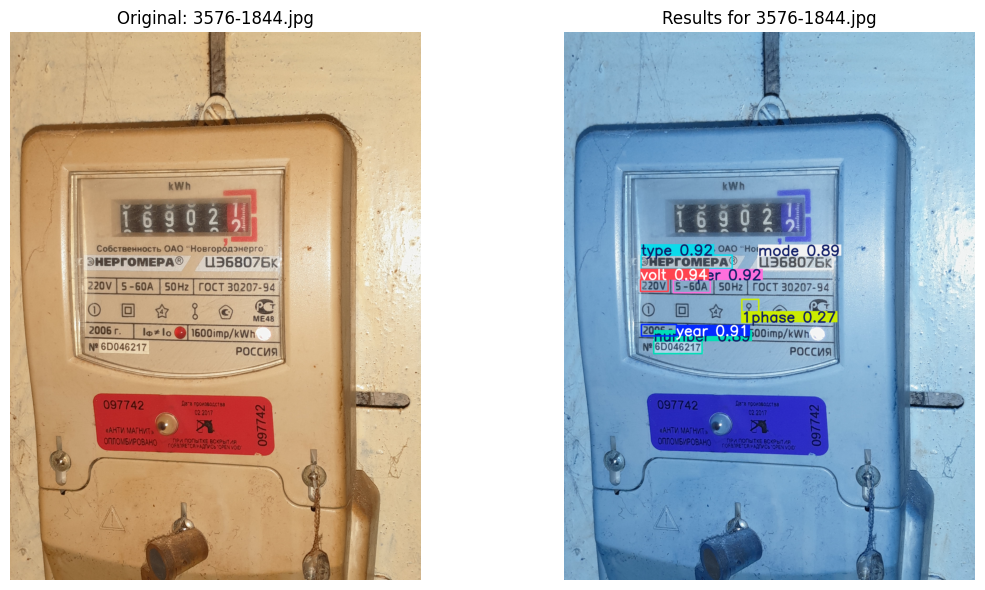


0: 640x480 1094.1ms
Speed: 6.8ms preprocess, 1094.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 480)


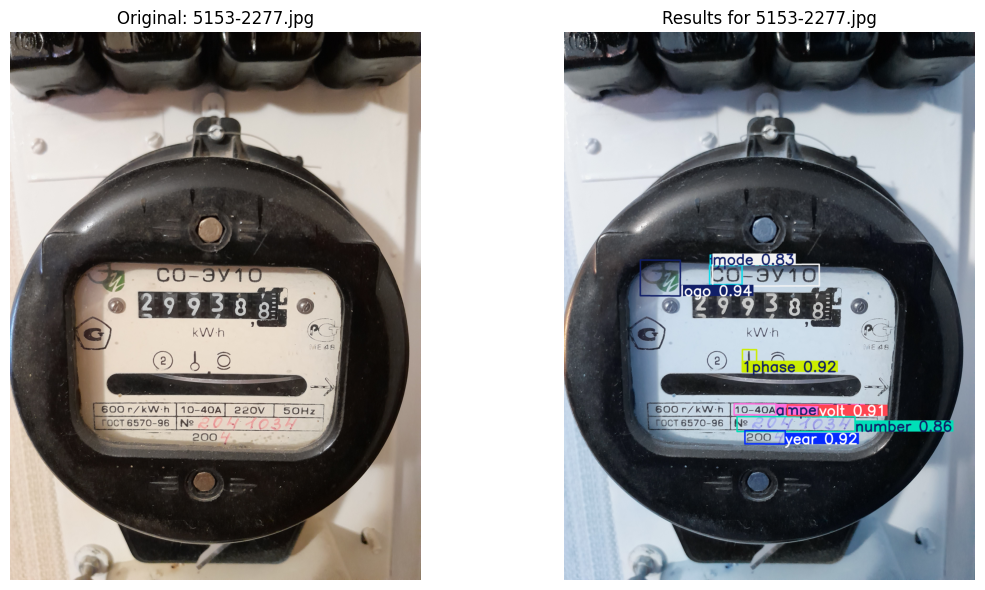


0: 640x480 1466.2ms
Speed: 5.4ms preprocess, 1466.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 480)


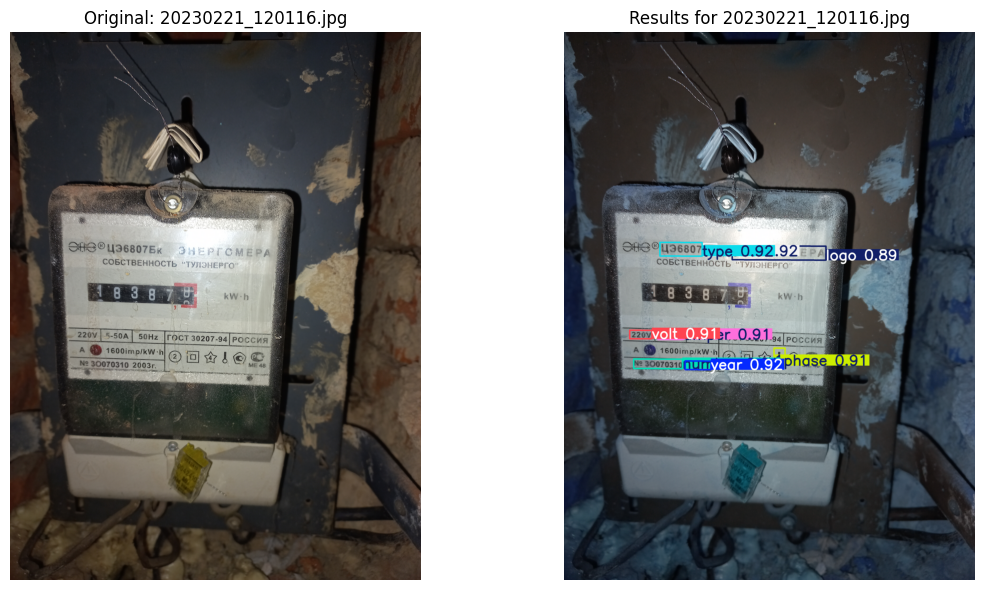


0: 640x288 808.4ms
Speed: 4.8ms preprocess, 808.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 288)


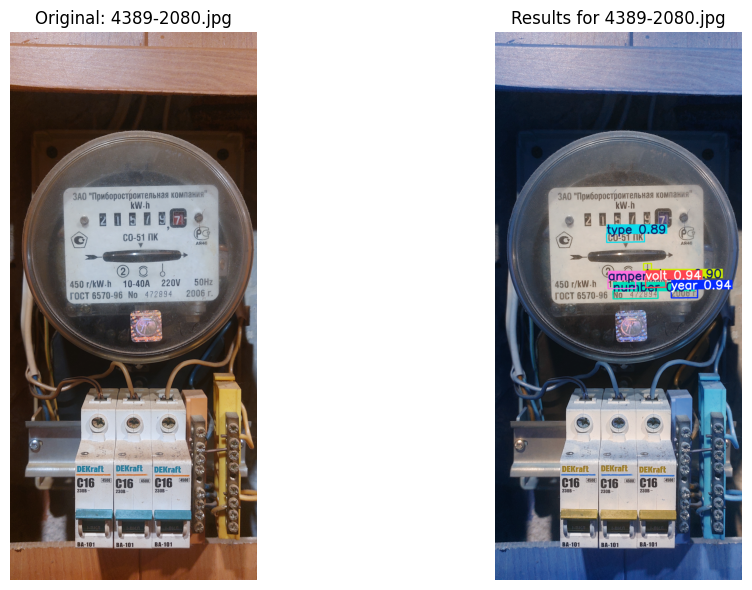


0: 640x480 1330.1ms
Speed: 6.3ms preprocess, 1330.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 480)


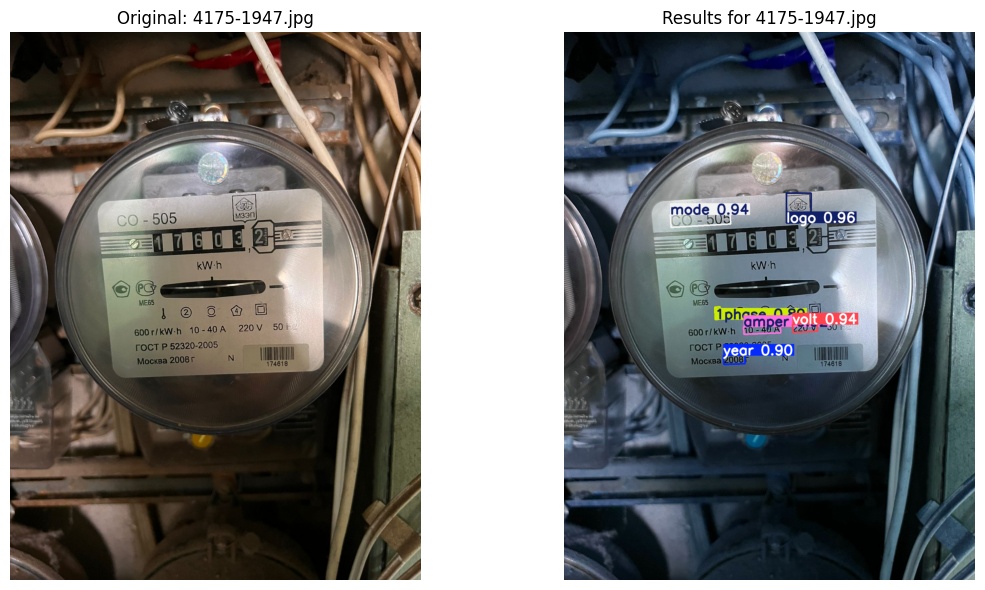


0: 640x480 1817.7ms
Speed: 5.6ms preprocess, 1817.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)


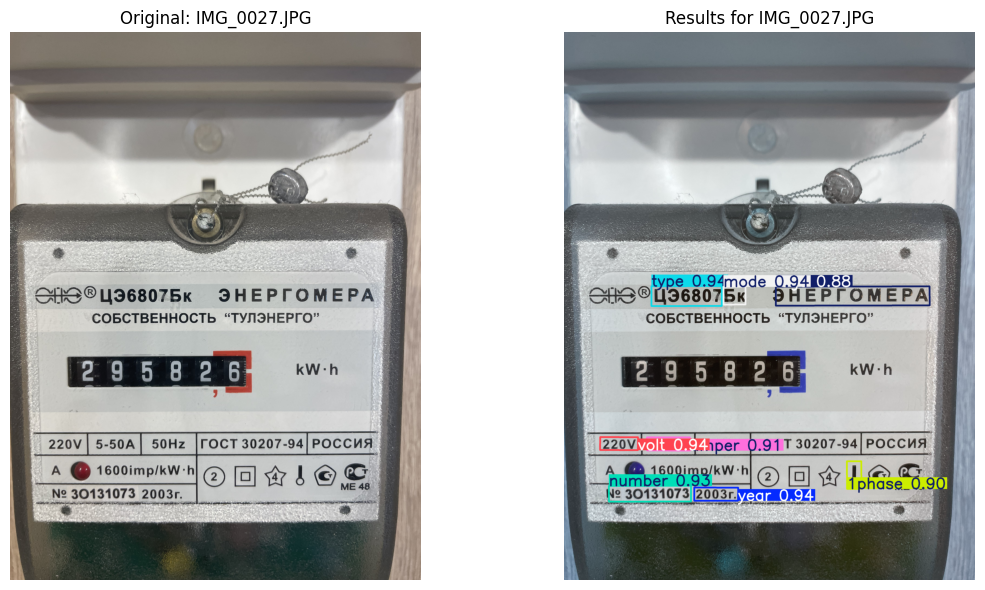


0: 640x480 1247.1ms
Speed: 5.6ms preprocess, 1247.1ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 480)


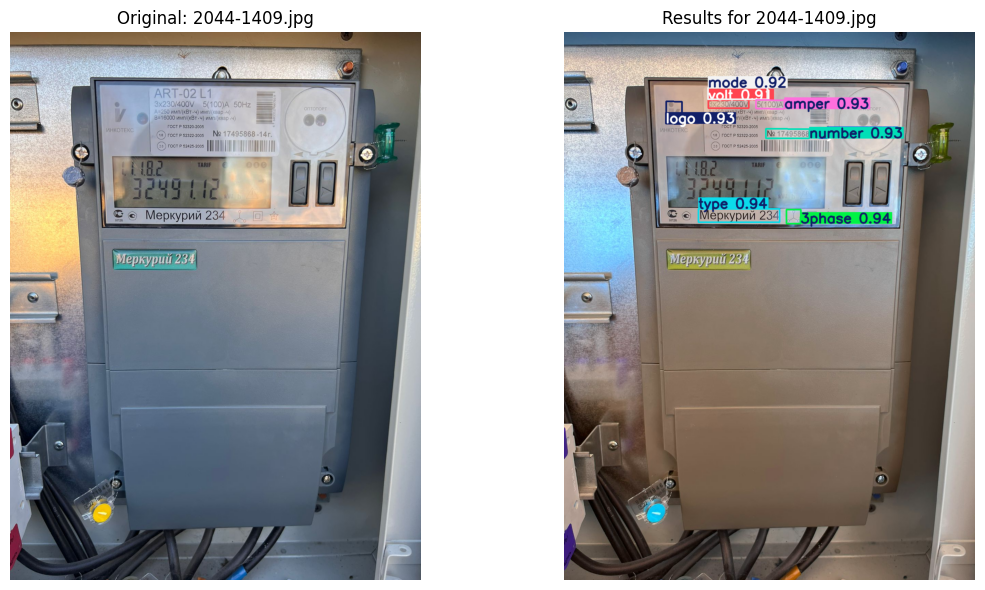


0: 640x480 1232.2ms
Speed: 10.5ms preprocess, 1232.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 480)


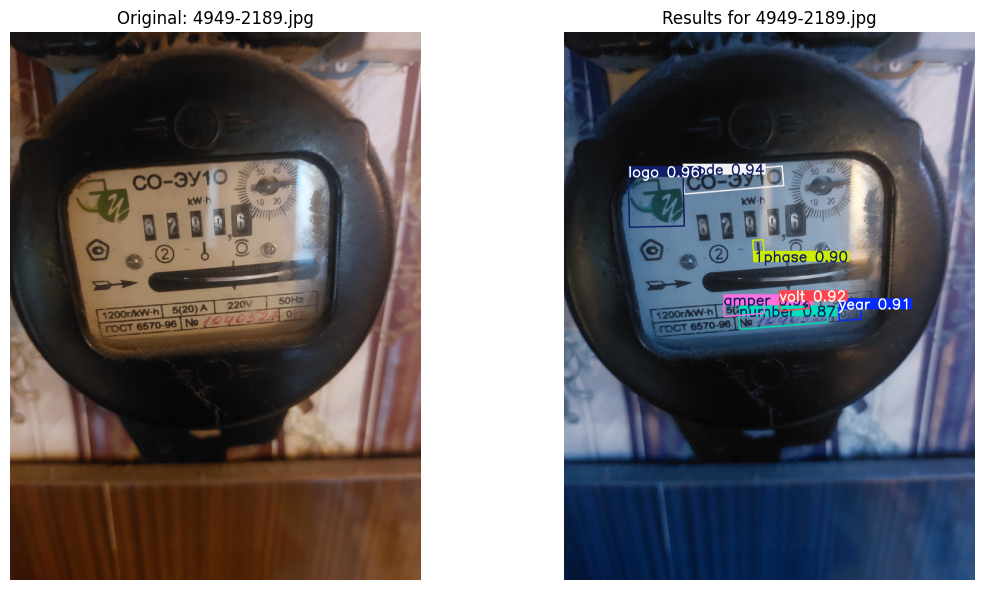


0: 640x480 1688.1ms
Speed: 5.3ms preprocess, 1688.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 480)


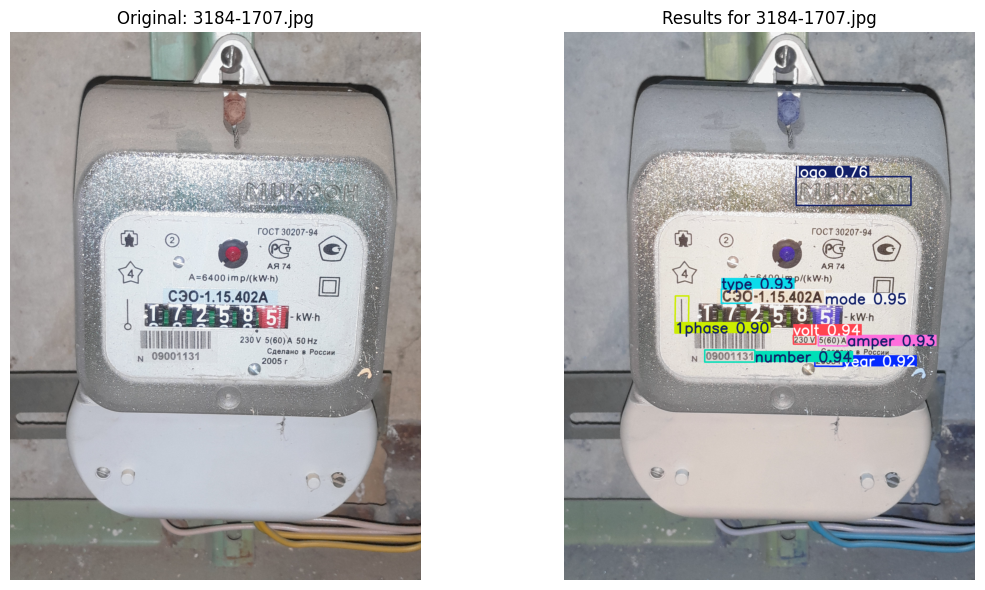


0: 640x480 1217.6ms
Speed: 6.4ms preprocess, 1217.6ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 480)


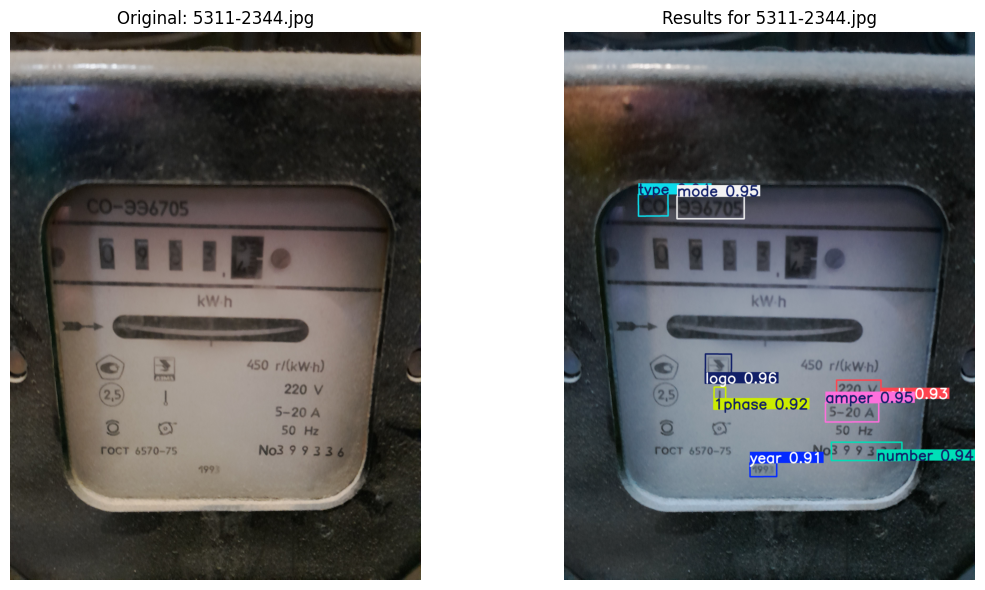


0: 640x288 1234.0ms
Speed: 3.4ms preprocess, 1234.0ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 288)


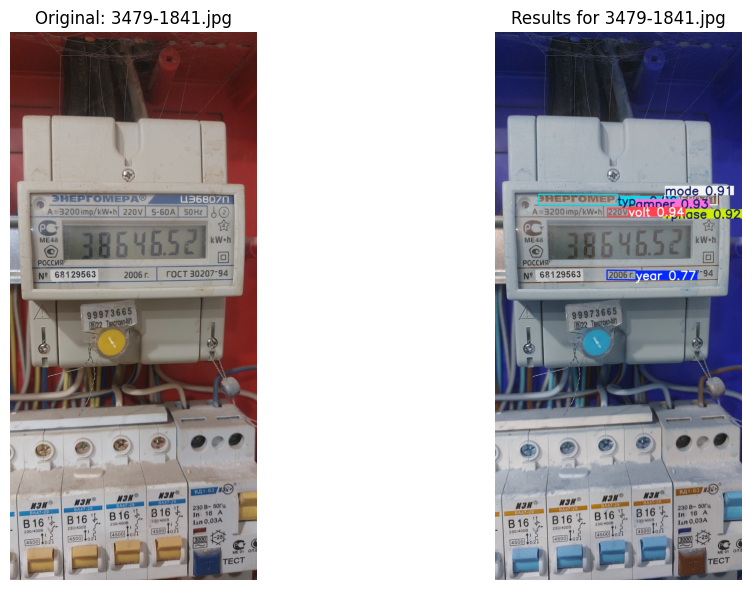


0: 640x480 1241.3ms
Speed: 5.2ms preprocess, 1241.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)


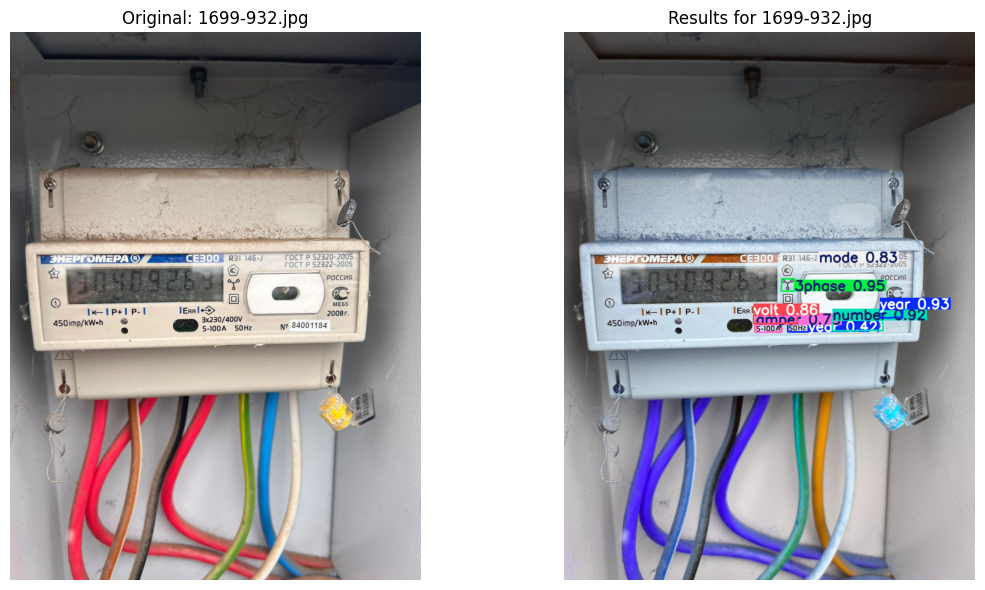


0: 640x480 1245.6ms
Speed: 8.5ms preprocess, 1245.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)


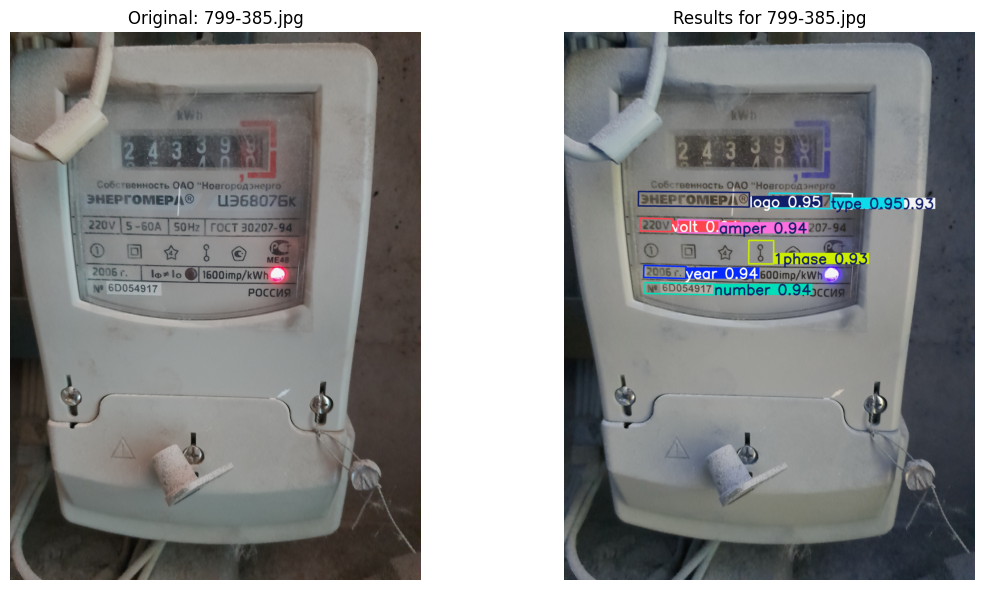


0: 640x480 1741.0ms
Speed: 6.1ms preprocess, 1741.0ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 480)


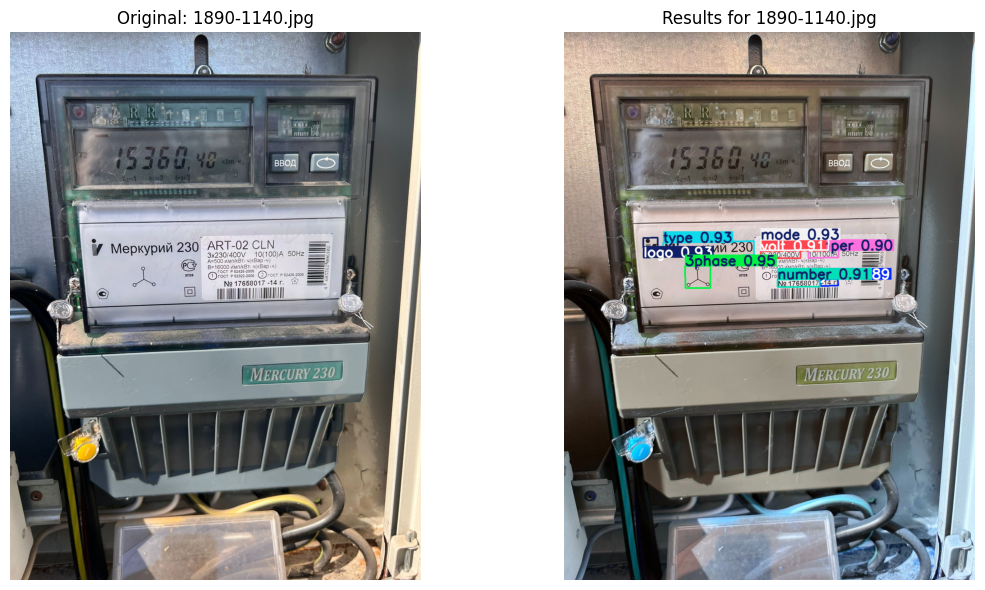


0: 640x480 1612.6ms
Speed: 5.2ms preprocess, 1612.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)


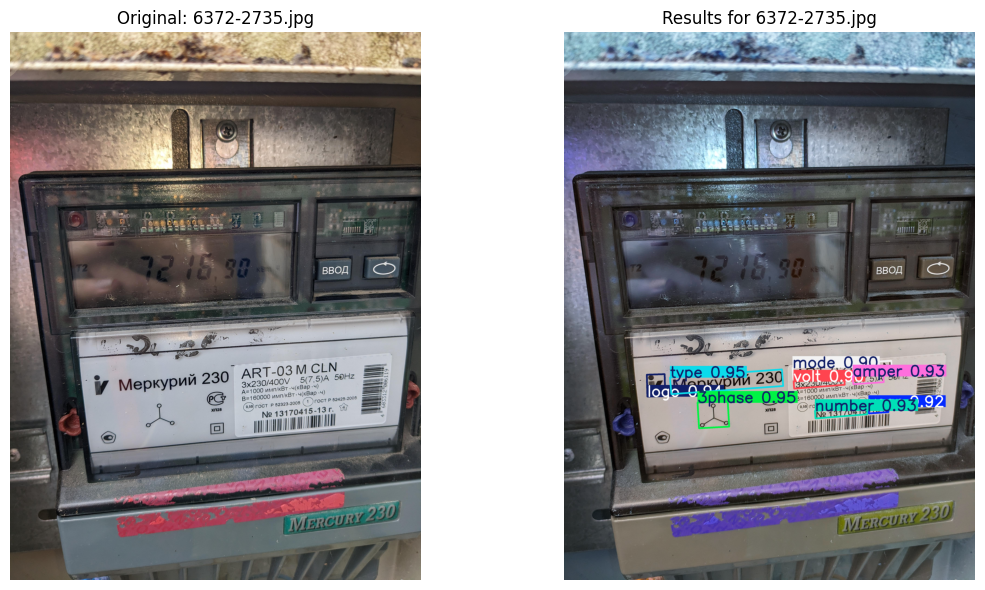


0: 640x480 1180.4ms
Speed: 5.6ms preprocess, 1180.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)


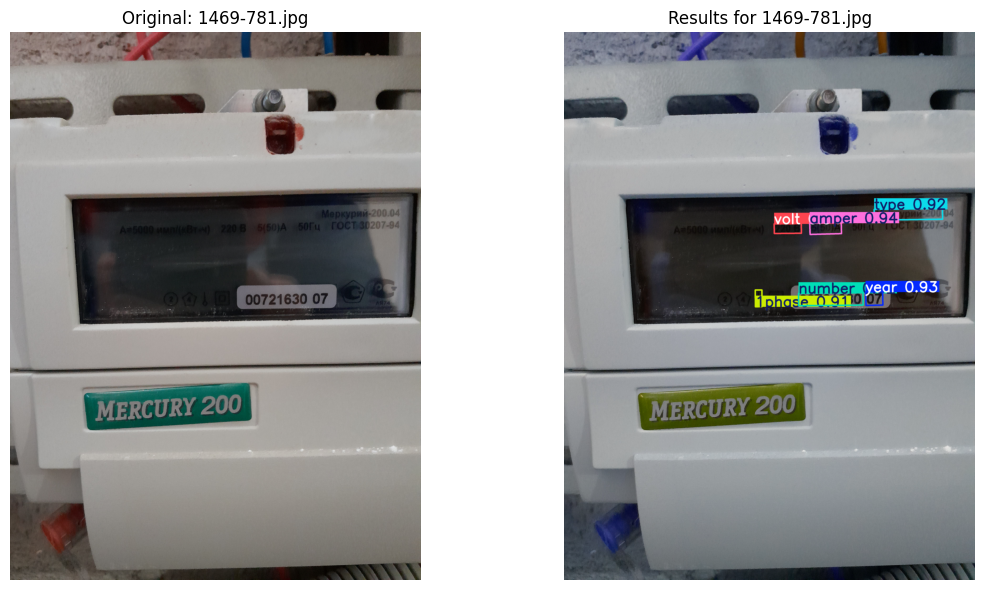


0: 640x480 2012.3ms
Speed: 7.7ms preprocess, 2012.3ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 480)


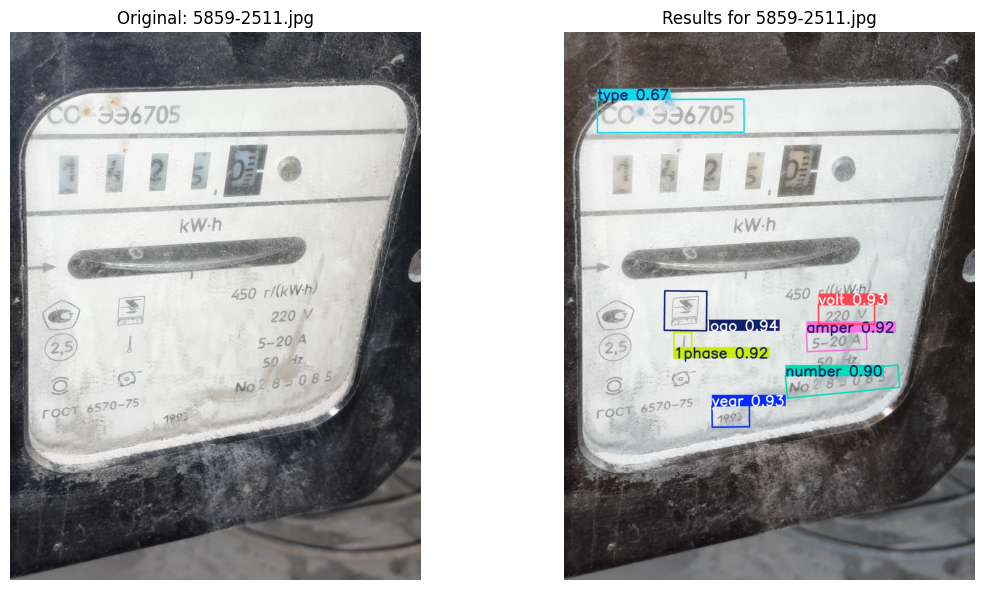


0: 640x288 927.0ms
Speed: 5.7ms preprocess, 927.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 288)


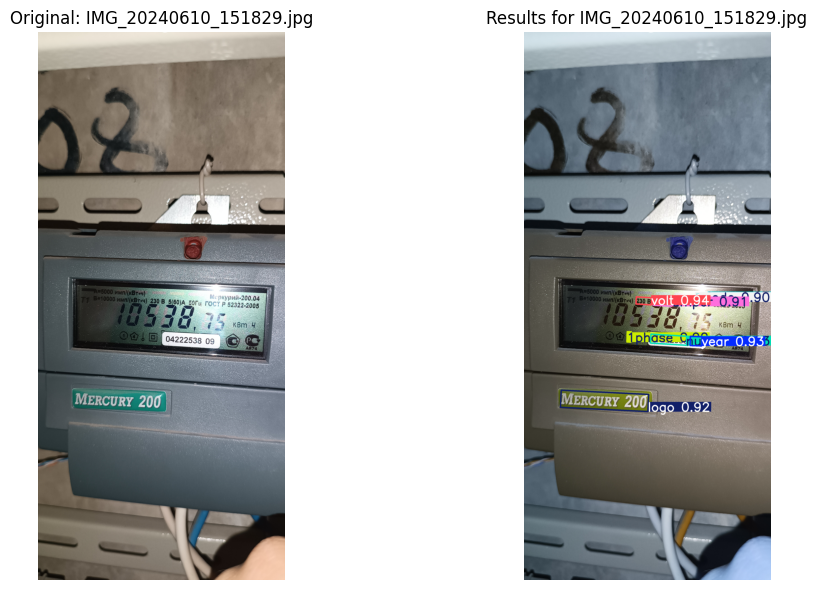


0: 640x480 1886.7ms
Speed: 5.5ms preprocess, 1886.7ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 480)


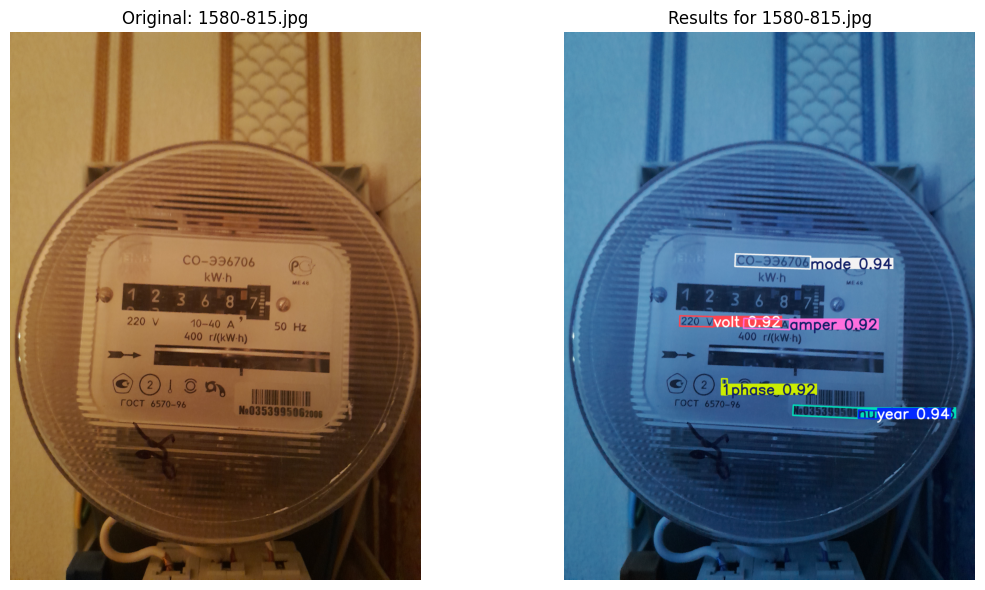


0: 640x288 940.2ms
Speed: 3.3ms preprocess, 940.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 288)


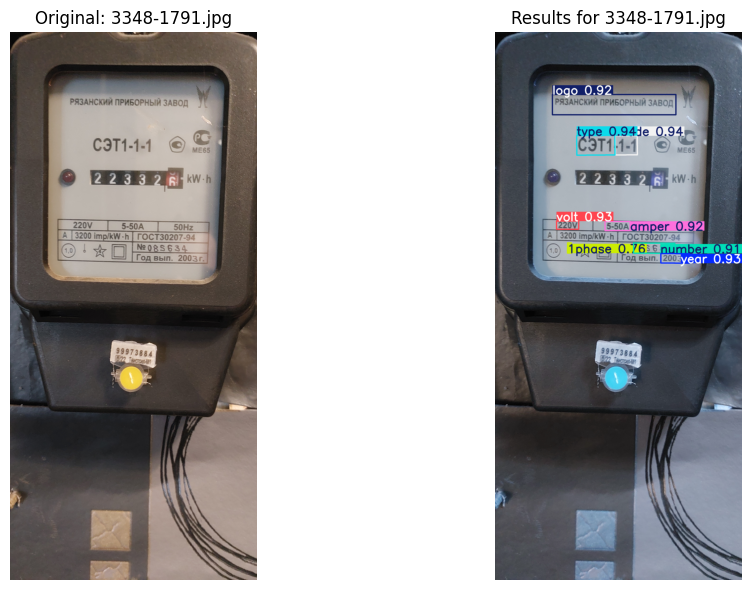


0: 640x480 1223.1ms
Speed: 7.7ms preprocess, 1223.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 480)


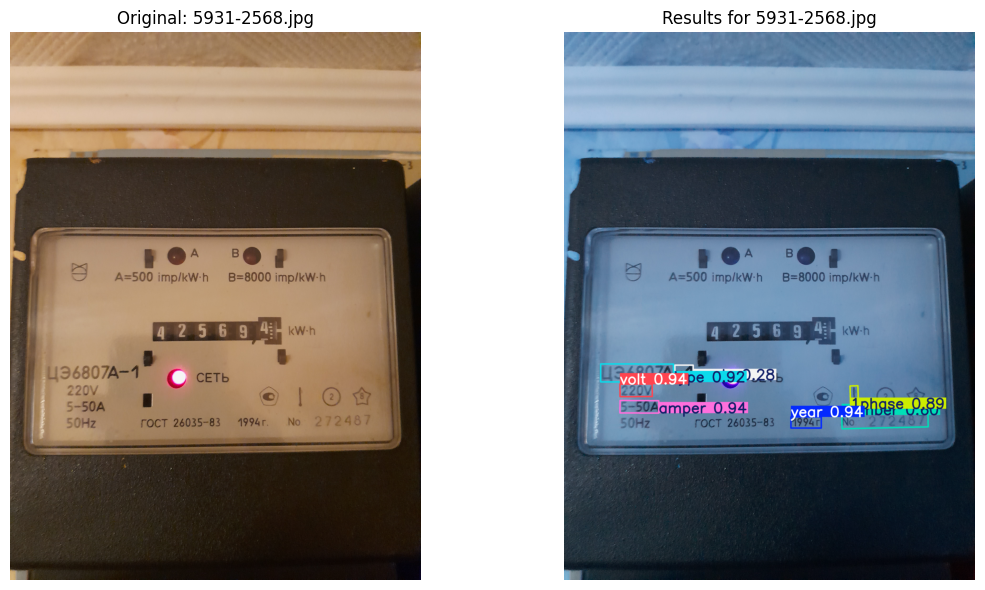


0: 640x480 1201.8ms
Speed: 7.6ms preprocess, 1201.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 480)


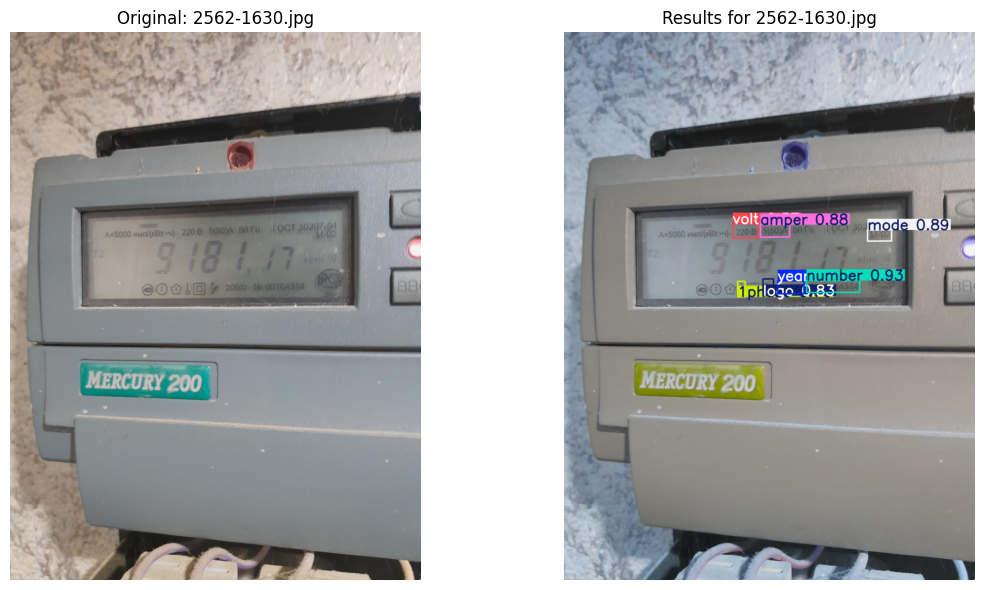


0: 640x288 904.3ms
Speed: 3.5ms preprocess, 904.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 288)


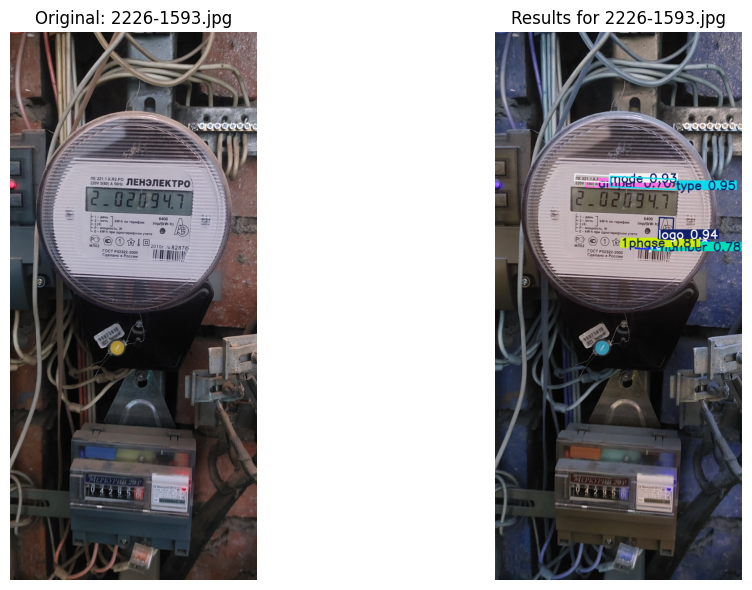


0: 640x480 1770.7ms
Speed: 5.3ms preprocess, 1770.7ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 480)


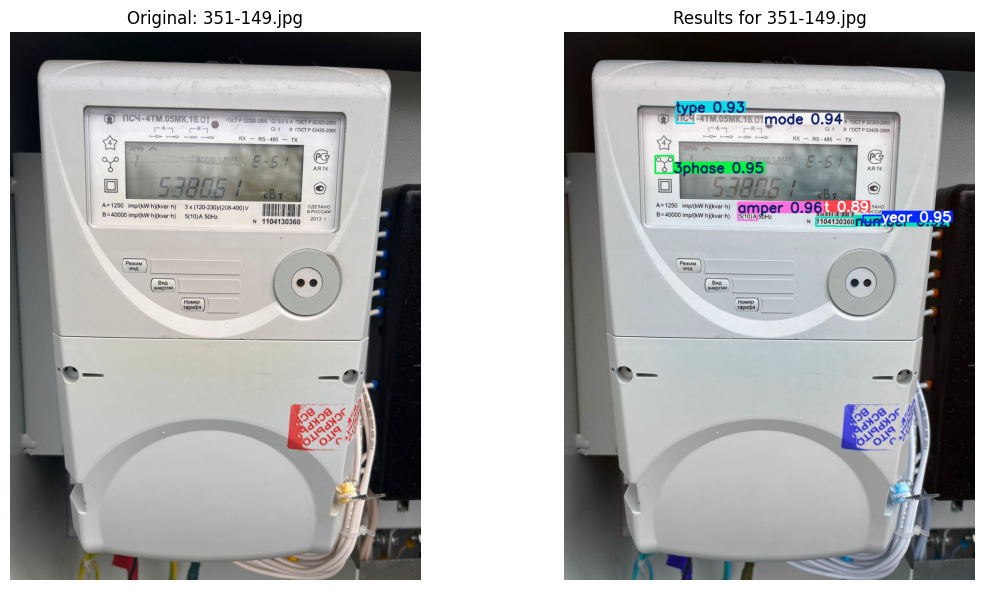

In [ ]:
# Проходим по каждому изображению
for img_name in test_images:
    img_path = os.path.join(test_images_path, img_name)
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Выполнение предсказания
    results = model(img_rgb, imgsz=640, iou=0.4, conf=0.25, verbose=True)

    # Получение аннотированного изображения
    annotated_frame = results[0].plot()
    annotated_frame_rgb = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)

    # Создание фигуры с подписями для каждого изображения
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    axs[0].imshow(img_rgb)
    axs[0].axis('off')
    axs[0].set_title(f'Original: {img_name}')

    axs[1].imshow(annotated_frame_rgb)
    axs[1].axis('off')
    axs[1].set_title(f'Results for {img_name}')

    plt.tight_layout()
    plt.show()

# Распознование СИ c помощью CRNN_model

In [ ]:
import re
from PIL import Image
from transformers import TrOCRProcessor, VisionEncoderDecoderModel
import torch

In [ ]:
# Ссылка на модель CRNN
url_model = 'https://drive.google.com/file/d/****'
file_model = '*****'
download_model = f'https://drive.google.com/uc?id={file_model}'

# Папка скачивания
output = '/content/'  # Укажите нужное имя файла, например 'your_file.zip'

# Скачивание файла
gdown.download(download_model, output, quiet=False)

# Путь, куда вы хотите извлечь файлы
extract_to = '/content'

!unzip -q -o best_model.zip  -d {extract_to}

## Функции для модели CRNN

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import load_model
from itertools import groupby

# Определение класса CTCLayer
class CTCLayer(layers.Layer):
    def __init__(self, **kwargs):
        super(CTCLayer, self).__init__(**kwargs)
        self.loss_fn = tf.keras.backend.ctc_batch_cost

    def call(self, y_true, y_pred):
        batch_len = tf.cast(tf.shape(y_true)[0], dtype="int64")
        input_length = tf.cast(tf.shape(y_pred)[1], dtype="int64")
        label_length = tf.cast(tf.shape(y_true)[1], dtype="int64")

        input_length = input_length * tf.ones(shape=(batch_len, 1), dtype="int64")
        label_length = label_length * tf.ones(shape=(batch_len, 1), dtype="int64")

        loss = self.loss_fn(y_true, y_pred, input_length, label_length)
        self.add_loss(loss)

        return y_pred

    # Добавляем метод get_config для правильной десериализации
    def get_config(self):
        config = super(CTCLayer, self).get_config()
        return config

    # Добавляем метод from_config для правильной десериализации
    @classmethod
    def from_config(cls, config):
        return cls(**config)

# Словарь
char_list = [' ', '(', ')', ',', '-', '.', '/', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D', 'E', 'F', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'Y', 'o', 'x', 'А', 'Б', 'В', 'Г', 'Е', 'И', 'Й', 'К', 'Л', 'М', 'Н', 'О', 'П', 'Р', 'С', 'Т', 'У', 'Ц', 'Ч', 'Э', 'г', 'е', 'и', 'й', 'к', 'п', 'р', 'у', '№']
index_to_char = {i: char for i, char in enumerate(char_list)}
blank_index = len(char_list)

def ctc_decoder(preds, blank_index):
    # Получаем индексы с максимальной вероятностью для каждого временного шага
    pred_indices = np.argmax(preds, axis=-1)

    # Убираем повторяющиеся символы и символы blank
    decoded_texts = []
    for pred in pred_indices:
        decoded_text = []
        previous_char = None
        for char_index in pred:
            if char_index != blank_index and char_index != previous_char:
                decoded_text.append(char_list[char_index])
            previous_char = char_index
        decoded_texts.append(''.join(decoded_text))

    return decoded_texts

# Предобработка изображения
def preprocess_image(image):
    # Проверяем количество каналов в изображении
    if len(image.shape) == 3 and image.shape[2] == 3:  # Если изображение цветное (3 канала)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Усиление контуров текста (оставляем для черно-белого изображения)
    sharpen_kernel = np.array([[0, -1, 0],
                               [-1, 5, -1],
                               [0, -1, 0]])
    sharpened = cv2.filter2D(image, -1, sharpen_kernel)

    return sharpened

# Создание модели для инференса
def create_inference_model(model):
    # Получаем вход для изображения и выходной слой без CTC Loss
    image_input = model.input[0]
    dense_output = model.get_layer(name="dense2").output

    # Создаем новую модель для инференса
    inference_model = tf.keras.models.Model(inputs=image_input, outputs=dense_output)
    return inference_model

# Функция для извлечения чисел из текста и приведения их в нужный формат
def extract_numbers_and_format(text, is_year=False):
    if pd.isna(text):
        return text
    if not isinstance(text, str):  # Преобразуем в строку, если это не строка
        text = str(text)
    numbers = ''.join(re.findall(r'\d+', text))
    if is_year and len(numbers) == 2:  # Если год состоит из 2 цифр, добавляем "20" в начало
        numbers = "20" + numbers
    return int(numbers) if numbers.isdigit() else numbers


## Распознование с помощью модели CRNN

In [ ]:
# Загрузка модели с кастомным слоем CTC
model_CRNN = load_model('best_model_cer.keras', custom_objects={'CTCLayer': CTCLayer})

def recognize_text_with_crnn(image, model):
    # Предобработка изображения
    image = preprocess_image(image)
    image = cv2.resize(image, (128, 64))  # Настройка размера для модели
    image = image.astype('float32') / 255.0
    # Проверяем форму изображения и добавляем недостающие измерения
    if len(image.shape) == 2:  # Если изображение в формате (height, width)
        image = np.expand_dims(image, axis=-1)  # Добавляем канал (1 канал для черно-белого изображения)

    # Добавляем размер batch
    image = np.expand_dims(image, axis=0)  # Добавляем batch размер

    # Создаем инференс модель, если это еще не сделано
    inference_model = create_inference_model(model)

    # Получение предсказаний модели
    preds = inference_model.predict(image)

    # Декодирование с CTC
    decoded_text = ctc_decoder(preds, blank_index)

    return decoded_text


In [ ]:
# Создание пустого DataFrame для результатов
columns = labels + ['image_name']
columns.remove('logo')  # Удаляем 'logo' из столбцов таблицы
results_df = pd.DataFrame(columns=columns)

# Получение списка всех изображений в папке
all_images = os.listdir(test_images_path)

# Функция для сохранения вырезанных боксов в отдельные папки
def save_cropped_image(image, points, output_path):
    mask = np.zeros_like(image)
    cv2.fillPoly(mask, [points], (255, 255, 255))
    cropped_img = cv2.bitwise_and(image, mask)
    rect = cv2.boundingRect(points)
    cropped_img = cropped_img[rect[1]:rect[1]+rect[3], rect[0]:rect[0]+rect[2]]
    cv2.imwrite(output_path, cropped_img)

# Обработка изображений и распознавание текста
for img_name in all_images:
    img_path = os.path.join(test_images_path, img_name)
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Выполнение предсказания (здесь используем вашу модель)
    results = model.predict(source=img_rgb, imgsz=640, iou=0.4, conf=0.25, verbose=True)

    # Создание папки для сохранения вырезанных боксов
    output_dir = os.path.join("cropped_boxes", img_name.split('.')[0])
    os.makedirs(output_dir, exist_ok=True)

    # Проверка наличия результатов
    if results:
        obb = results[0].obb
        if obb is not None and obb.xyxyxyxy is not None:
            # Распознавание текста с помощью CRNN для каждой обнаруженной OBB
            image_results = {'image_name': img_name}
            for i in range(len(obb.xyxyxyxy)):
                box = obb.xyxyxyxy[i]
                if box is not None:
                    # Получаем 8 координат OBB
                    points = box.cpu().numpy().astype(int).reshape(-1, 2)

                    label = labels[int(obb.cls[i])]

                    # Проверка наличия меток '1phase' и '3phase'
                    if label == '1phase':
                        image_results['1phase'] = 'однофазный'
                    elif label == '3phase':
                        image_results['3phase'] = 'трехфазный'

                    # Пропускаем метки 'logo', '1phase' и '3phase' для распознавания текста
                    if label not in ['logo', '1phase', '3phase']:
                        # Сохранение вырезанного бокса
                        cropped_image_path = os.path.join(output_dir, f"{label}_box_{i}.png")
                        save_cropped_image(img_rgb, points, cropped_image_path)

                        # Преобразование изображения для модели CRNN
                        detected_text = recognize_text_with_crnn(cv2.imread(cropped_image_path), model_CRNN)
                        image_results[label] = detected_text

            # Добавление результатов в DataFrame
            results_df = pd.concat([results_df, pd.DataFrame([image_results])], ignore_index=True)



0: 640x480 3130.2ms
Speed: 24.6ms preprocess, 3130.2ms inference, 56.4ms postprocess per image at shape (1, 3, 640, 480)
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step

0: 640x480 1189.6ms
Speed: 7.0ms preprocess, 1189.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 907ms/step

0: 640x288 768.2ms
Speed: 5.8ms preprocess, 768.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 923ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 946ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 984ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step

0: 640x480 1508.4ms
Speed: 12.3ms preprocess, 1508.4ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 480)
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 929ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/s

In [ ]:
# Очистка и форматирование столбцов 'year'
if 'year' in results_df.columns:
    results_df['year'] = results_df['year'].apply(lambda x: extract_numbers_and_format(x, is_year=True))

# Вывод на экран DataFrame
results_df.head(24)

,year,type,mode,number,amper,volt,1phase,3phase,image_name
0,2003,[ЦЭ6807],[Бк],[№340501967],[5-50A],[220V],однофазный,NaN,IMG_0027.JPG
1,2003,[ЦЭ6807],[Бк],[№3O070310],[5-50A],[220V],однофазный,NaN,20230221_120116.jpg
2,2006,[СО-51 ПК],NaN,[№ 472894],[10-40A],[220V],однофазный,NaN,4389-2080.jpg
3,1993,[СО-ЭЭ6705],NaN,[№ 285085],[5-20 A],[220 V],однофазный,NaN,5859-2511.jpg
4,0,[Меркурий-020.0],[Меркурий-02004002],[03422348],[5(00)A],[206],однофазный,NaN,IMG_20240610_151829.jpg
5,1994,[ЦЭ6807А],[-1],[№272487],[5-50A],[220V],однофазный,NaN,5931-2568.jpg
6,1993,[СО],[ЭЭ6705],[399336],[5-20A],[220 V],однофазный,NaN,5311-2344.jpg
7,2006,[ЭНЕРГОМЕРА],[ЦЭ6807Бк],[6D046217],[5-60A],[220V],однофазный,NaN,3576-1844.jpg
8,0,NaN,[СО-ЭУ10],[№104052],[5(20)A],[220V],однофазный,NaN,4949-2189.jpg
9,2006,[ЭНЕРГОМЕРА],[ЦЭ6807П],NaN,[5-60A],[220V],однофазный,NaN,3479-1841.jpg


# Сбор боксов по классам для обучения OCR

In [ ]:
# Пути
train_images_path = '/content/train/images'
val_images_path = '/content/val/images'
obb_save_path = '/content/OBB'
annotations = {}

# Сопоставление числовых классов с именами папок
class_mapping = {
    0: 'year',
    1: 'type',
    2: 'mode',
    3: 'number',
    4: 'logo',
    5: 'amper',
    6: 'volt',
    7: '1phase',
    8: '3phase'
}

# Создание структуры папок
for folder_name in class_mapping.values():
    os.makedirs(os.path.join(obb_save_path, folder_name), exist_ok=True)

# Функция для обработки изображений и сохранения OBB
def process_and_save_obb(img_path, img_name, model, obb_save_path):
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Выполнение предсказания
    results = model(img_rgb)

    # Проверка наличия результатов
    if results and len(results) > 0:
        result = results[0]  # Получаем первый результат
        obb = getattr(result, 'obb', None)

        if obb is not None and hasattr(obb, 'cls') and obb.cls is not None:
            predicted_classes = obb.cls.int().tolist()  # Получаем классы как список целых чисел
            for idx, cls_num in enumerate(predicted_classes):
                class_name = class_mapping.get(cls_num)
                if class_name:
                    save_path = os.path.join(obb_save_path, class_name)

                    # Получаем 8 координат OBB
                    if hasattr(obb, 'xyxyxyxy') and obb.xyxyxyxy is not None:
                        points = obb.xyxyxyxy[idx].cpu().numpy().astype(int).reshape(-1, 2)

                        # Создаем маску для извлечения области OBB
                        mask = np.zeros_like(img_rgb)
                        cv2.fillPoly(mask, [points], (255, 255, 255))

                        # Извлечение OBB из изображения
                        cropped_img = cv2.bitwise_and(img_rgb, mask)
                        rect = cv2.boundingRect(points)
                        cropped_img = cropped_img[rect[1]:rect[1] + rect[3], rect[0]:rect[0] + rect[2]]

                        # Проверяем, что обрезанное изображение не пустое
                        if cropped_img.size > 0:
                            obb_img_path = os.path.join(save_path, f"{img_name.split('.')[0]}_obb_{idx}.png")
                            cv2.imwrite(obb_img_path, cropped_img)
                            print(f"Сохранено: {obb_img_path}")

                            # Добавление информации в аннотации
                            annotations[obb_img_path] = {
                                "class": class_name,
                                "text": f"Class {class_name} detected"
                            }
                        else:
                            print(f"Пустое изображение при обработке {img_name} для класса {class_name}")

# Получение списка всех изображений из train и val папок
image_paths = [os.path.join(train_images_path, img) for img in os.listdir(train_images_path)]
image_paths += [os.path.join(val_images_path, img) for img in os.listdir(val_images_path)]

# Обработка изображений
for img_path in image_paths:
    img_name = os.path.basename(img_path)
    process_and_save_obb(img_path, img_name, model, obb_save_path)

# Сохранение аннотаций в JSON-файл
annotations_path = os.path.join(obb_save_path, "annotations.json")
with open(annotations_path, 'w') as f:
    json.dump(annotations, f, ensure_ascii=False, indent=4)

# Архивирование папки OBB
zipf = zipfile.ZipFile('/content/OBB.zip', 'w', zipfile.ZIP_DEFLATED)
for root, dirs, files in os.walk(obb_save_path):
    for file in files:
        zipf.write(os.path.join(root, file), os.path.relpath(os.path.join(root, file), os.path.join(obb_save_path, '..')))
zipf.close()

print("Все изображения обработаны, распределены по классам, аннотации добавлены и данные заархивированы.")

Выходные данные были обрезаны до нескольких последних строк (5000).
Сохранено: /content/OBB/number/1362-700_obb_2.png
Сохранено: /content/OBB/volt/1362-700_obb_3.png
Сохранено: /content/OBB/1phase/1362-700_obb_4.png
Сохранено: /content/OBB/type/1362-700_obb_5.png
Сохранено: /content/OBB/type/1362-700_obb_6.png

0: 640x480 1183.3ms
Speed: 6.7ms preprocess, 1183.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 480)
Сохранено: /content/OBB/3phase/1945-1215_obb_0.png
Сохранено: /content/OBB/logo/1945-1215_obb_1.png
Сохранено: /content/OBB/number/1945-1215_obb_2.png
Сохранено: /content/OBB/type/1945-1215_obb_3.png
Сохранено: /content/OBB/mode/1945-1215_obb_4.png
Сохранено: /content/OBB/volt/1945-1215_obb_5.png
Сохранено: /content/OBB/year/1945-1215_obb_6.png
Сохранено: /content/OBB/amper/1945-1215_obb_7.png

0: 640x480 1552.9ms
Speed: 6.5ms preprocess, 1552.9ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 480)
Сохранено: /content/OBB/amper/779-356_obb_0.png
Сох

In [ ]:
import json
# Заданный порядок классов
class_order = ["year", "type", "mode", "number", "amper", "volt"]

# Загружаем JSON файл с аннотациями
with open('/content/annotations.json', 'r', encoding='utf-8') as f:
    annotations = json.load(f)

# Удаляем записи с ненужными классами
filtered_annotations = {
    key: value for key, value in annotations.items() if value["class"] not in ["3phase", "1phase", "logo"]
}

# Сортируем оставшиеся аннотации по заданному порядку классов
sorted_annotations = {}
for class_name in class_order:
    for key, value in filtered_annotations.items():
        if value["class"] == class_name:
            sorted_annotations[key] = value

# Сохраняем отсортированные аннотации в новый файл
with open('/content/sorted_filtered_annotations.json', 'w', encoding='utf-8') as f:
    json.dump(sorted_annotations, f, ensure_ascii=False, indent=4)

print("Аннотации успешно отфильтрованы и отсортированы.")

Аннотации успешно отфильтрованы и отсортированы.
